# Import Libraries

In [2]:
# A.C
!pip install --upgrade tensorflow
!pip install tensorflow keras
!pip install --upgrade tensorflow keras

from tensorflow import keras

!pip install keras
import tensorflow.keras as keras
import pandas as pd
from PIL import Image

# O.C
import keras 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import imutils
import cv2
import PIL.Image
%matplotlib inline

import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import mplcyberpunk
plt.style.use("cyberpunk")
import cv2
import tensorflow as tf
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalMaxPooling2D,GlobalAveragePooling2D, Dropout, Dense, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard, ModelCheckpoint
from sklearn.metrics import classification_report,confusion_matrix
from tqdm import tqdm


# Exploratory Data Analysis (EDA) and Visualisation

### Dataset Path

Path to the Brain Tumor Classification Dataset (Training and Testing Datase)

In [5]:
# Path to dataset directory
dataset_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification'

### Visualised Sample Images of the Brain Tumor

Display a sample of images from each category **(Training and Testing Dataset)**

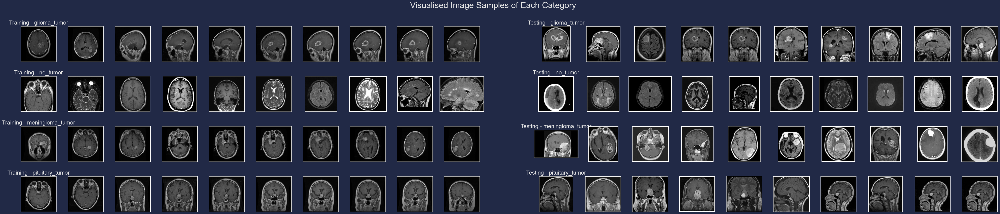

In [7]:
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

# Function to show sample images from all categories
def show_sample_images(dataset_path, categories, num_samples=10):
    num_rows = len(categories)
    num_cols = (num_samples * 2) + 1
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 3, num_rows * 3))
    
    # Function to add border to an image
    def add_border(img, color='white', border_width=5):
        return ImageOps.expand(img, border=border_width, fill=color)
    
    for row, category in enumerate(categories):
        train_path = os.path.join(dataset_path, 'Training', category)
        test_path = os.path.join(dataset_path, 'Testing', category)
        
        # Display sample images from the training set
        sample_images_train = os.listdir(train_path)[:num_samples]
        for col, image_name in enumerate(sample_images_train):
            img_path = os.path.join(train_path, image_name)
            img = Image.open(img_path)
            img = add_border(img)
            axes[row, col].imshow(img)
            axes[row, col].axis('off')
            if col == 0:
                axes[row, col].set_title(f'Training - {category}', fontsize=20)
        
        # Display sample images from the testing set
        sample_images_test = os.listdir(test_path)[:num_samples]
        for col, image_name in enumerate(sample_images_test):
            img_path = os.path.join(test_path, image_name)
            img = Image.open(img_path)
            img = add_border(img)
            axes[row, num_samples + 1 + col].imshow(img)
            axes[row, num_samples + 1 + col].axis('off')
            if col == 0:
                axes[row, num_samples + 1 + col].set_title(f'Testing - {category}', fontsize=20)
    
    # Remove grid lines and tick marks
    for ax in axes.flatten():
        ax.axis('off')
    
    fig.suptitle('Visualised Image Samples of Each Category', fontsize=30)
    fig.subplots_adjust(hspace=0.4, wspace=0.05)
    plt.show()

# Define the categories to be displayed
categories = ['glioma_tumor', 'no_tumor', 'meningioma_tumor', 'pituitary_tumor']

# Define the dataset path
dataset_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification'

# Show sample images from all categories
show_sample_images(dataset_path, categories)


### Image Grid of each Brain Tumor Category

Image Grid of Brain Tumor: **Training Dataset**

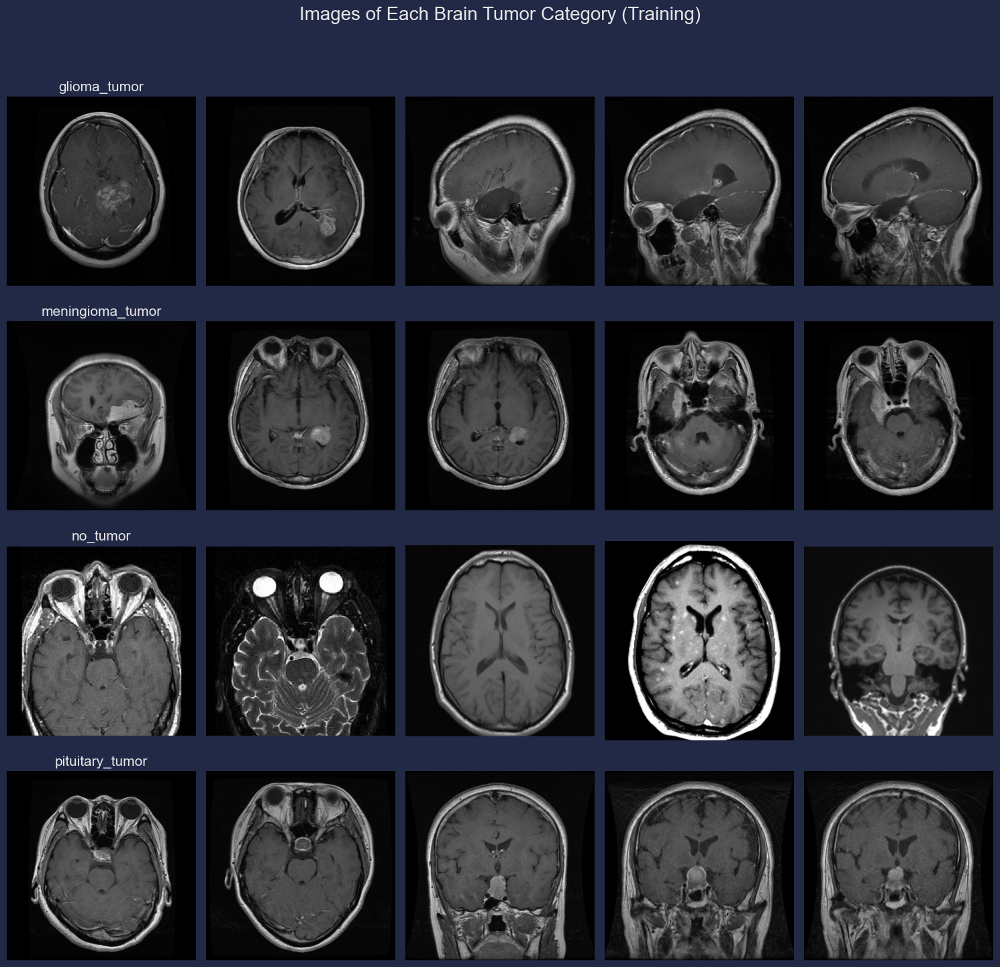

In [10]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def show_image_grid_with_titles(dataset_path, num_images=5):
    categories = os.listdir(dataset_path)
    fig, axes = plt.subplots(len(categories), num_images, figsize=(15, 15))
    
    for i, category in enumerate(categories):
        category_path = os.path.join(dataset_path, category)
        
        # Check if the category_path is a directory
        if os.path.isdir(category_path):
            sample_images = os.listdir(category_path)[:num_images]
            
            for j, image_name in enumerate(sample_images):
                img_path = os.path.join(category_path, image_name)
                try:
                    img = Image.open(img_path)
                    axes[i, j].imshow(img, cmap='gray')
                    axes[i, j].axis('off')
                    if j == 0:
                        axes[i, j].set_title(category, fontsize=15)
                except PermissionError:
                    print(f"Permission denied for file: {img_path}")
                    axes[i, j].axis('off')  # Hide the axis if the image cannot be accessed
                except Exception as e:
                    print(f"Error opening file {img_path}: {e}")
                    axes[i, j].axis('off')  # Hide the axis if the image cannot be accessed
    

    fig.suptitle('Images of Each Brain Tumor Category (Training)', fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.95])  
    plt.show()
    

# Direct the dataset path to the parent folder containing the categories
dataset_path = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training"
show_image_grid_with_titles(dataset_path)


#### Observations

**Glioma Tumor**

- **Origin**: Arises from glial cells, which support and protect neurons.
- **Location**: Can occur anywhere within the brain or spinal cord.
- **Imaging Characteristics**: On MRI, gliomas appear as intra-axial (within the brain tissue) masses. They can have variable enhancement patterns with contrast. High-grade gliomas (e.g., glioblastomas) often show irregular borders, necrotic areas, and significant surrounding edema.

**Meningioma Tumor**

- **Origin**: Arises from the meninges, the membranes that cover the brain and spinal cord.- **Location**: Typically found on the surface of the brain or spinal cords.
- **Imaging Characteristics**: On MRI or CT scans, meningiomas usually appear as well-defined, extra-axial (outside the brain tissue), and often have a "dural tail" sign where the tumor seems to extend along the meninges. They often enhance with contras.

**No Tumor**
  
**Image Characteristics**: On MRI or CT scans, no abnormal mass or lesion is observed. The brain, meninges, and pituitary gland appear normal without signs of abnormal enhancement, mass effect or edema.

**Pituitary Tumor**

- **Origin**: Develops in the pituitary gland, located at the base of the brain.
- **Location**: Located in the sella turcica, a small cavity in the sphenoid bone.
- **Imaging Characteristics**: On MRI, pituitary tumors (adenomas) are usually seen as a mass in the sella turcica. They can enhance with contrast, and larger tumors might show suprasellar extension.

**Training Dataset Image Characteristics**

- The image characteristics of the Training Dataset are relatively around the same sizes regarding width and height in each categories.


#### Image Grid of Brain Tumor: Testing Dataset

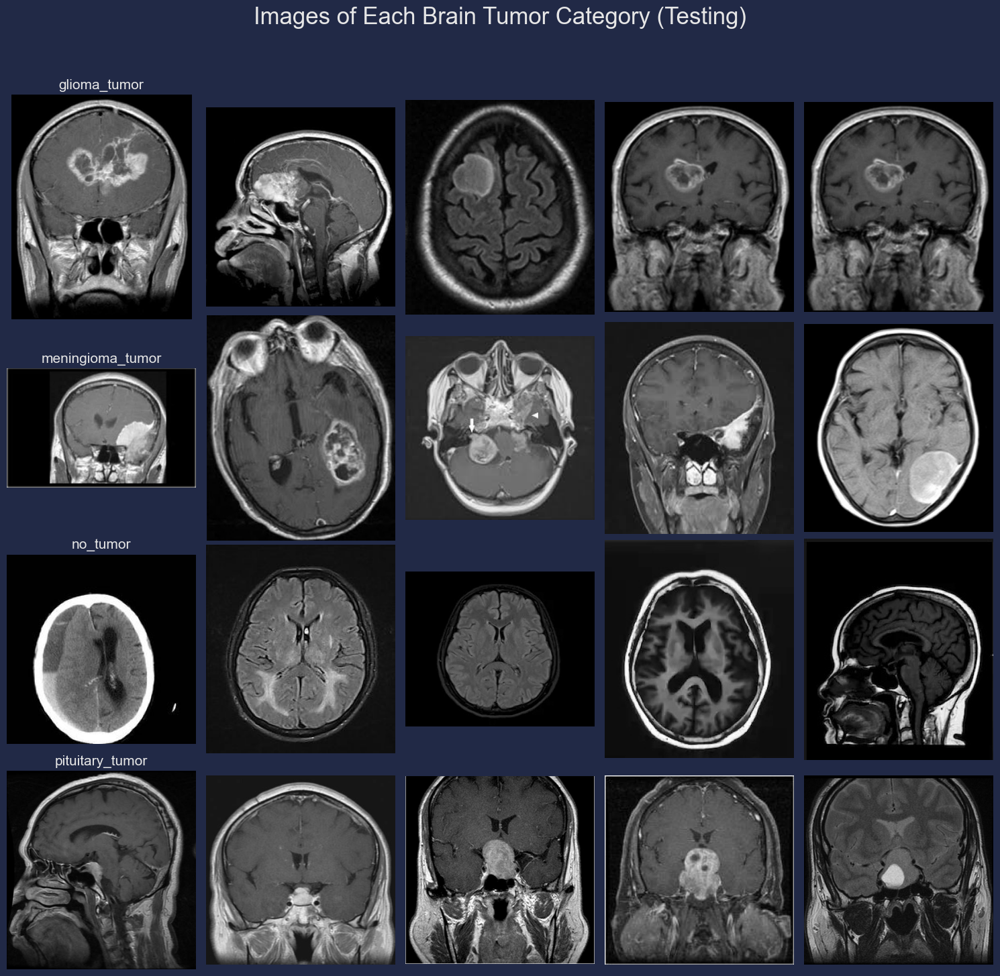

In [13]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def show_image_grid_with_titles(dataset_path, num_images=5):
    categories = os.listdir(dataset_path)
    fig, axes = plt.subplots(len(categories), num_images, figsize=(15, 15))
    
    for i, category in enumerate(categories):
        category_path = os.path.join(dataset_path, category)
        
        # Check if the category_path is a directory
        if os.path.isdir(category_path):
            sample_images = os.listdir(category_path)[:num_images]
            
            for j, image_name in enumerate(sample_images):
                img_path = os.path.join(category_path, image_name)
                try:
                    img = Image.open(img_path)
                    axes[i, j].imshow(img, cmap='gray')
                    axes[i, j].axis('off')
                    if j == 0:
                        axes[i, j].set_title(category, fontsize=15)
                except PermissionError:
                    print(f"Permission denied for file: {img_path}")
                    axes[i, j].axis('off')  # Hide the axis if the image cannot be accessed
                except Exception as e:
                    print(f"Error opening file {img_path}: {e}")
                    axes[i, j].axis('off')  # Hide the axis if the image cannot be accessed
    
    fig.suptitle('Images of Each Brain Tumor Category (Testing)', fontsize=25)
    plt.tight_layout(rect=[0, 0, 1, 0.95])  
    plt.show()

# Direct the dataset path to the parent folder containing the categories
dataset_path = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Testing"
show_image_grid_with_titles(dataset_path)


#### Observations

**Glioma Tumor**

- **Origin**: Arises from glial cells, which support and protect neurons.
- **Location**: Can occur anywhere within the brain or spinal cord.
- **Imaging Characteristics**: On MRI, gliomas appear as intra-axial (within the brain tissue) masses. They can have variable enhancement patterns with contrast. High-grade gliomas (e.g., glioblastomas) often show irregular borders, necrotic areas, and significant surrounding edema.

**Meningioma Tumor**

- **Origin**: Arises from the meninges, the membranes that cover the brain and spinal cord.
- **Location**: Typically found on the surface of the brain or spinal cord.
- **Imaging Characteristics**: On MRI or CT scans, meningiomas usually appear as well-defined, extra-axial (outside the brain tissue), and often have a "dural tail" sign where the tumor seems to extend along the meninges. They often enhance with contrast.

**No Tumor**

**Imaging Characteristics**: On MRI or CT scans, no abnormal mass or lesion is observed. The brain, meninges, and pituitary gland appear normal without signs of abnormal enhancement, mass ef

**Pituitary Tumor**

- **Origin**: Develops in the pituitary gland, located at the base of the brain.
- **Location**: Located in the sella turcica, a small cavity in the sphenoid bone.
- **Imaging Characteristics**: On MRI, pituitary tumors (adenomas) are usually seen as a mass in the sella turcica. They can enhance with contrast, and larger tumors might show suprasellar extension.

**Training Dataset Image Characteristics**

- The image characteristics of the Testing Dataset varies on the sizes regarding width and height and also the hues and tones within the MRI brain scan in each categories.



### Class Distrubution

Number of items via Path

In [17]:
import os 

train_path = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training"
test_path = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Testing"

g_tr = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training\\glioma_tumor"
m_tr = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training\\meningioma_tumor"
p_tr = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training\\pituitary_tumor"
n_tr = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training\\no_tumor"

g_tst = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Testing\\glioma_tumor"
m_tst = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Testing\\meningioma_tumor"
p_tst = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Testing\\pituitary_tumor"
n_tst = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Testing\\no_tumor"

g_tr = os.listdir(g_tr)
m_tr = os.listdir(m_tr)
p_tr = os.listdir(p_tr)
n_tr = os.listdir(n_tr)

g_tst = os.listdir(g_tst)
m_tst = os.listdir(m_tst)
p_tst = os.listdir(p_tst)
n_tst = os.listdir(n_tst)

In [18]:
print(len(g_tr))
print(len(m_tr))
print(len(n_tr))
print(len(p_tr))

826
822
395
827


In [19]:
print(len(g_tst))
print(len(m_tst))
print(len(n_tst))
print(len(p_tst))

100
115
105
74


### Distrubution of Images per Category

Number of images in each category (Training and Testing Datase)

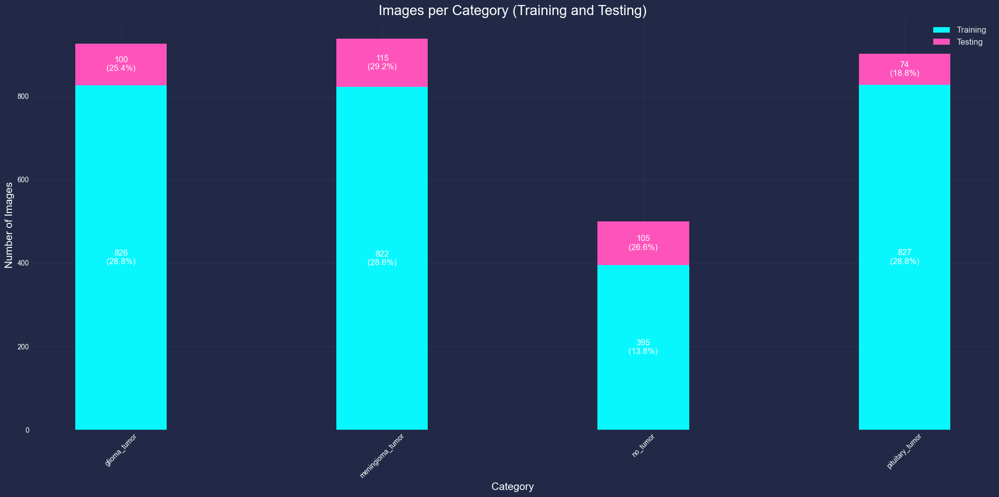

In [21]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import mplcyberpunk

def plot_category_distribution_with_cyberpunk_style(dataset_path):
    train_path = os.path.join(dataset_path, 'Training')
    test_path = os.path.join(dataset_path, 'Testing')
    
    # Get categories from the Training folder
    categories = os.listdir(train_path)
    
    # Initialize lists to store number of images in each category for training and testing
    num_images_train = []
    num_images_test = []
    
    # Calculate number of images per category in Training and Testing folders
    for category in categories:
        train_category_path = os.path.join(train_path, category)
        test_category_path = os.path.join(test_path, category)
        
        num_train = len(os.listdir(train_category_path))
        num_test = len(os.listdir(test_category_path))
        
        num_images_train.append(num_train)
        num_images_test.append(num_test)
    
    # Calculate percentages
    total_train = sum(num_images_train)
    total_test = sum(num_images_test)
    percent_train = [(num / total_train) * 100 for num in num_images_train]
    percent_test = [(num / total_test) * 100 for num in num_images_test]
    
    # Apply cyberpunk style
    plt.style.use("cyberpunk")
    
    # Plotting
    fig, ax = plt.subplots(figsize=(20, 10))
    
    bar_width = 0.35
    index = range(len(categories))
    
    # Plot training images
    bars_train = ax.bar(index, num_images_train, bar_width, label='Training', zorder=1)
    
    # Plot testing images stacked on top of training images
    bars_test = ax.bar(index, num_images_test, bar_width, bottom=num_images_train, label='Testing', zorder=1)
    
    # Add data labels with colors
    for i, num in enumerate(num_images_train):
        ax.text(i, num + num_images_test[i] / 2, f'{num_images_test[i]}\n({percent_test[i]:.1f}%)', ha='center', va='center', fontsize=12, color='white', zorder=2)
        ax.text(i, num / 2, f'{num}\n({percent_train[i]:.1f}%)', ha='center', va='center', fontsize=12, color='white', zorder=2)
    
    ax.set_xlabel('Category', fontsize=15, color='white')
    ax.set_ylabel('Number of Images', fontsize=15, color='white')
    ax.set_title('Images per Category (Training and Testing)', fontsize=20, color='white')
    ax.set_xticks(index)
    ax.set_xticklabels(categories, rotation=45, color='white')
    ax.legend(fontsize=12)
    ax.spines['top'].set_color('white')
    ax.spines['bottom'].set_color('white')
    ax.spines['left'].set_color('white')
    ax.spines['right'].set_color('white')
    ax.yaxis.label.set_color('white')
    ax.xaxis.label.set_color('white')
    ax.tick_params(axis='x', colors='white')
    ax.tick_params(axis='y', colors='white')
    
    # Add cyberpunk glow effects
    mplcyberpunk.add_glow_effects()

    plt.tight_layout()
    plt.show()

# Plot category distribution within Training and Testing folders
dataset_path = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification"  # Replace with the path to your dataset
plot_category_distribution_with_cyberpunk_style(dataset_path)


### Number and Percentage of Images per Category (Training and Testing)

#### Observations

**meningioma_tumor** has the **highest** number of images within the category.
   - Testing  - 115 images (29.2%)
   - Training - 822 images (28.6%)

**no_tumor** has the **lowest** number of images within the category.
   - Testing  - 105 images (26.6%)
   - Training - 395 images (13.8%)
   
**pituitary_tumor** has the **highest** number of images in **Testing** and the **lowest** number of images in **Training** in each category.
   - Testing  - 74  (18.8%)
   - Training - 827 (28.8%)

### Dimensions Analysis

#### Image Size Distribution

Analysis of the distribution of image sizes in the dataset.

#### Image Size Distribution: Training Dataset

#### Distribution of Image Widths and Heights:

- **X-axis**: Represents the width/height of the images in pixels.
- **Y-axis**: Represents the frequency (or count) of images that fall into each width bin.
- **Histogram Bars**: Show the number of images that have widths/height within each bin range.
- **KDE (Kernel Density Estimate)**: Represents the distribution density of image widths (a method to visualize the underlying probability density function of the data).

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

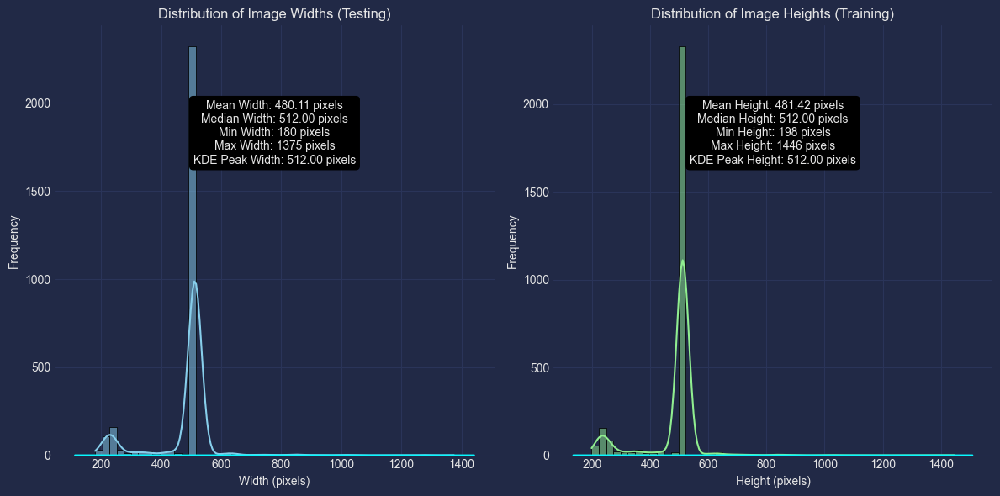

In [26]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import numpy as np

def plot_image_size_distribution(dataset_path):
    image_sizes = []
    categories = os.listdir(dataset_path)
    
    for category in categories:
        category_path = os.path.join(dataset_path, category)
        try:
            if os.path.isdir(category_path):  # Check if it's a directory
                for image_name in os.listdir(category_path):
                    img_path = os.path.join(category_path, image_name)
                    try:
                        img = Image.open(img_path)
                        image_sizes.append(img.size)
                    except Exception as e:
                        print(f"Error opening image {img_path}: {e}")
            else:
                print(f"{category_path} is not a directory.")
        except Exception as e:
            print(f"Error accessing category path {category_path}: {e}")
    
    if image_sizes:
        widths, heights = zip(*image_sizes)
        
        # Remove infinite values
        widths = np.array(widths)
        heights = np.array(heights)
        widths = widths[np.isfinite(widths)]
        heights = heights[np.isfinite(heights)]
        
        plt.figure(figsize=(12, 6))
        
        # Plot width distribution
        ax1 = plt.subplot(1, 2, 1)
        sns.histplot(widths, bins=50, kde=True, color='skyblue')
        plt.title('Distribution of Image Widths (Testing)')
        plt.xlabel('Width (pixels)')
        plt.ylabel('Frequency')
        ax1.annotate(f"Mean Width: {np.mean(widths):.2f} pixels\n"
                     f"Median Width: {np.median(widths):.2f} pixels\n"
                     f"Min Width: {np.min(widths)} pixels\n"
                     f"Max Width: {np.max(widths)} pixels\n"
                     f"KDE Peak Width: {widths[np.argmax(sns.kdeplot(widths, cumulative=False).get_lines()[0].get_data()[1])]:.2f} pixels",
                     xy=(0.5, 0.75), xycoords='axes fraction',
                     fontsize=10, ha='center', va='center',
                     bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="black"))
        
        # Plot height distribution
        ax2 = plt.subplot(1, 2, 2)
        sns.histplot(heights, bins=50, kde=True, color='lightgreen')
        plt.title('Distribution of Image Heights (Training)')
        plt.xlabel('Height (pixels)')
        plt.ylabel('Frequency')
        ax2.annotate(f"Mean Height: {np.mean(heights):.2f} pixels\n"
                     f"Median Height: {np.median(heights):.2f} pixels\n"
                     f"Min Height: {np.min(heights)} pixels\n"
                     f"Max Height: {np.max(heights)} pixels\n"
                     f"KDE Peak Height: {heights[np.argmax(sns.kdeplot(heights, cumulative=False).get_lines()[0].get_data()[1])]:.2f} pixels",
                     xy=(0.5, 0.75), xycoords='axes fraction',
                     fontsize=10, ha='center', va='center',
                     bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="black"))
        
        plt.tight_layout()
        plt.show()
    else:
        print("No image sizes found to plot.")

# Example usage:
dataset_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training'
plot_image_size_distribution(dataset_path)


#### Distribution of Image:

#### Observations

**Width**

- **Mean Width**: "480.11 pixels" the average width of the images in your dataset is approximately 480 pixels.
- **Median Width**: "512.00 pixels" the median value (the middle value when sorted) of the image widths is 512 pixels.
- **Min Width**: "180 pixels" the smallest width among all images is 180 pixels.
- **Max Width**: "1375 pixels" the largest width among all images is 1375 pixels.

**Height**

- **Mean Width**: "481.42 pixels" the average width of the images in your dataset is approximately 481 pixels.
- **Median Width**: "512 pixels" the median value (the middle value when sorted) of the image widths is 512 pixels.
- **Min Width**: "198 pixels" the smallest width among all images is 198 pixels.
- **Max Width**: "1446 pixels" the largest width among all images is 1446 pixels.

#### Aspect Ratio Consistency:

- The mean and median values being almost the same for both width and height indicate that most images in the dataset are square or have a consistent aspect ratio.

- Range of Sizes:
The range (difference between maximum and minimum) for width is 1195 pixels (1375 - 180), while for height it is 1248 pixels (1446 - 198). This suggests a slightly broader range of heights compared to widths, indicating a bit more variability in height dimensions.

- Distribution Insights:
Both dimensions follow a similar distribution pattern with a slight variation where height tends to have more extreme values compared to width.

**KDE (Kernel Density Estimate)**:

Peaks in the KDE line represent areas where data points (image widths or heights) are more densely packed. These are the values that are most common within the dataset.

- **Width Distribution**:

A peak at 512 pixels in the KDE line, indicates that many images have a width around 512 pixels.
If the KDE line has a broader peak, it suggests that there is more variability in the image widths around that value.

- **Height Distribution**:

Similarly, a peak in the height KDE line at 512 pixels means that a significant number of images have heights around 512 pixels.
Broader peaks or multiple peaks can indicate a diverse set of image heights.

#### Image Size Distribution: Testing Dataset

C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating ins

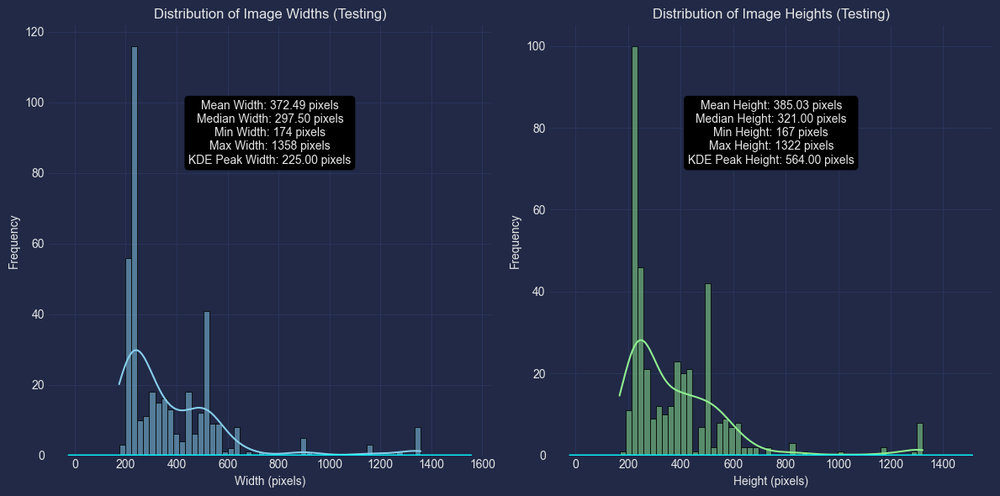

In [29]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import numpy as np

def plot_image_size_distribution(dataset_path):
    image_sizes = []
    categories = os.listdir(dataset_path)
    
    for category in categories:
        category_path = os.path.join(dataset_path, category)
        try:
            if os.path.isdir(category_path):  # Check if it's a directory
                for image_name in os.listdir(category_path):
                    img_path = os.path.join(category_path, image_name)
                    try:
                        img = Image.open(img_path)
                        image_sizes.append(img.size)
                    except Exception as e:
                        print(f"Error opening image {img_path}: {e}")
            else:
                print(f"{category_path} is not a directory.")
        except Exception as e:
            print(f"Error accessing category path {category_path}: {e}")
    
    if image_sizes:
        widths, heights = zip(*image_sizes)
        
        # Remove infinite values
        widths = np.array(widths)
        heights = np.array(heights)
        widths = widths[np.isfinite(widths)]
        heights = heights[np.isfinite(heights)]
        
        plt.figure(figsize=(12, 6))
        
        # Plot width distribution
        ax1 = plt.subplot(1, 2, 1)
        sns.histplot(widths, bins=50, kde=True, color='skyblue')
        plt.title('Distribution of Image Widths (Testing)')
        plt.xlabel('Width (pixels)')
        plt.ylabel('Frequency')
        ax1.annotate(f"Mean Width: {np.mean(widths):.2f} pixels\n"
                     f"Median Width: {np.median(widths):.2f} pixels\n"
                     f"Min Width: {np.min(widths)} pixels\n"
                     f"Max Width: {np.max(widths)} pixels\n"
                     f"KDE Peak Width: {widths[np.argmax(sns.kdeplot(widths, cumulative=False).get_lines()[0].get_data()[1])]:.2f} pixels",
                     xy=(0.5, 0.75), xycoords='axes fraction',
                     fontsize=10, ha='center', va='center',
                     bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="black"))
        
        # Plot height distribution
        ax2 = plt.subplot(1, 2, 2)
        sns.histplot(heights, bins=50, kde=True, color='lightgreen')
        plt.title('Distribution of Image Heights (Testing)')
        plt.xlabel('Height (pixels)')
        plt.ylabel('Frequency')
        ax2.annotate(f"Mean Height: {np.mean(heights):.2f} pixels\n"
                     f"Median Height: {np.median(heights):.2f} pixels\n"
                     f"Min Height: {np.min(heights)} pixels\n"
                     f"Max Height: {np.max(heights)} pixels\n"
                     f"KDE Peak Height: {heights[np.argmax(sns.kdeplot(heights, cumulative=False).get_lines()[0].get_data()[1])]:.2f} pixels",
                     xy=(0.5, 0.75), xycoords='axes fraction',
                     fontsize=10, ha='center', va='center',
                     bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="black"))
        
        plt.tight_layout()
        plt.show()
    else:
        print("No image sizes found to plot.")

# Example usage:
dataset_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Testing'
plot_image_size_distribution(dataset_path)


#### Distribution of Image:

#### Observations

**Width**

- **Mean Width**: "372.49 pixels" the average width of the images in your dataset is approximately 372 pixels.
- **Median Width**: "297.50 pixels" the median value (the middle value when sorted) of the image widths is 297 pixels.
- **Min Width**: "174 pixels" the smallest width among all images is 174 pixels.
- **Max Width**: "1358 pixels" the largest width among all images is 1358 pixels.

**Height**

- **Mean Width**: "385.03 pixels" the average width of the images in your dataset is approximately 385 pixels.
- **Median Width**: "321.00 pixels" the median value (the middle value when sorted) of the image widths is 321 pixels.
- **Min Width**: "167 pixels" the smallest width among all images is 167 pixels.
- **Max Width**: "1322 pixels" the largest width among all images is 1322 pixels.

**Aspect Ratio Consistency**:
- The close values of mean and median for both width and height suggest that the aspect ratio of the images is relatively consistent, with a slight tendency towards being taller rather than wider
- Both the mean and median values for height are greater than those for width, indicating that, on average, images are taller. The median values being lower than the mean values in both dimensions suggest that there are a few images with larger sizes that are increasing the mean values, which implies a right-skewed distribution.
- The smallest and largest images are fairly balanced between width and height, but with a slight preference for width in the extremes. This could imply that while the average image is taller, the dataset still contains a significant number of wider images at the extreme ends.

**Range of Sizes**:
- The close values of mean and median for both width and height suggest that the aspect ratio of the images is relatively consistent, with a slight tendency towards being taller rather than wider.

**KDE (Kernel Density Estimate)**:
Peaks in the KDE line represent areas where data points (image widths or heights) are more densely packed. These are the values that are most common within the dataset.

- **Width Distribution**:
A peak at 225.00 pixels in the KDE line, indicates that many images have a width around 225 pixels.
If the KDE line has a broader peak, it suggests that there is more variability in the image widths around that value.

- **Height Distribution**:
Similarly, a peak in the height KDE line at 564 pixels means that a significant number of images have heights around 564 pixels.
Broader peaks or multiple peaks can indicate a diverse set of image heights.

#### Implementations

- **Augumentation**: It may be practical to choose a target size that maintains the slight height bias, such as 320x384 pixels, to preserve the general aspect ratio of the dataset and being aware of the slight height bias vertical flips and slight vertical scaling could match better regarding the dataset's natural tendencies.
- **Padding and Cropping**: For standardizing image sizes, padding might be more needed in the width dimension to reach a consistent aspect ratio, while cropping might be done more carefully to preserve height.

### Box Plot of Image Dimensions

#### Analysis for understanding the variability in image dimensions.

Utilising Box Plots to visualise the distrubution of image dimension for each catgeory. Each box plot represents the distribution of image heights within different categories of brain tumor images.

#### Similar statistical markers: 
- Min: Minimum width within the category.
- Q1: First quartile (25th percentile) of the width distribution.
- Median: Median width, the middle value within the category.
- Q3: Third quartile (75th percentile) of the width distribution.
- Max:  Maximum width within the category.

**Outliers**: Points outside the whiskers, indicating unusually high or low values compared to the majority of images in the category.

### Box Plot: Training Dataset

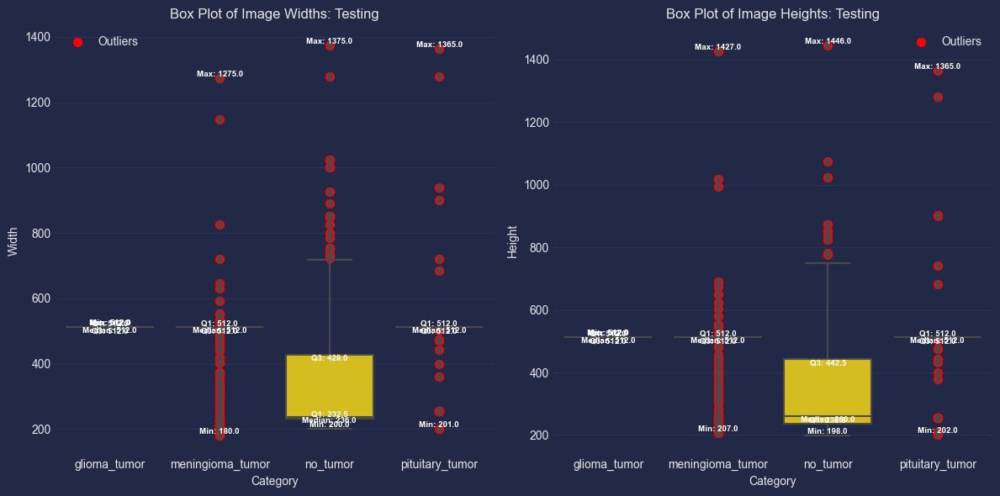

In [33]:
import pandas as pd

# Path to dataset directory
dataset_path = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training"

# Function to plot box plots of image dimensions with outliers labeled
def plot_image_dimensions_boxplot(dataset_path):
    widths, heights, categories_list = [], [], []
    categories = os.listdir(dataset_path)
    
    for category in categories:
        category_path = os.path.join(dataset_path, category)
        for image_name in os.listdir(category_path):
            img_path = os.path.join(category_path, image_name)
            try:
                img = Image.open(img_path)
                widths.append(img.width)
                heights.append(img.height)
                categories_list.append(category)
            except Exception as e:
                print(f"Error opening image {img_path}: {e}")
    
    df = pd.DataFrame({'Width': widths, 'Height': heights, 'Category': categories_list})
    
    plt.figure(figsize=(12, 6))
    
    # Plot for Image Widths
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Category', y='Width', data=df)
    plt.title('Box Plot of Image Widths: Testing')
    
    # Annotate with statistics (min, Q1, median, Q3, max) and outliers
    statistics_width = df.groupby('Category')['Width'].describe()
    outliers_plotted = False
    for i, category in enumerate(df['Category'].unique()):
        min_val = statistics_width.loc[category, 'min']
        q1_val = statistics_width.loc[category, '25%']
        median_val = statistics_width.loc[category, '50%']
        q3_val = statistics_width.loc[category, '75%']
        max_val = statistics_width.loc[category, 'max']
        outliers = df[(df['Category'] == category) & ((df['Width'] < q1_val - 1.5 * (q3_val - q1_val)) | (df['Width'] > q3_val + 1.5 * (q3_val - q1_val)))]['Width']
        
        plt.text(i, min_val, f'Min: {min_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        plt.text(i, q1_val, f'Q1: {q1_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        plt.text(i, median_val, f'Median: {median_val}', horizontalalignment='center', verticalalignment='top', size=7, color='white', weight='semibold')
        plt.text(i, q3_val, f'Q3: {q3_val}', horizontalalignment='center', verticalalignment='top', size=7, color='white', weight='semibold')
        plt.text(i, max_val, f'Max: {max_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        if not outliers.empty:
            if not outliers_plotted:
                plt.scatter([i] * len(outliers), outliers, color='red', marker='o', s=50, label='Outliers')
                outliers_plotted = True
            else:
                plt.scatter([i] * len(outliers), outliers, color='red', marker='o', s=50)
    
    plt.legend()
    
    # Plot for Image Heights
    plt.subplot(1, 2, 2)
    sns.boxplot(x='Category', y='Height', data=df)
    plt.title('Box Plot of Image Heights: Testing')
    
    # Annotate with statistics (min, Q1, median, Q3, max) and outliers
    statistics_height = df.groupby('Category')['Height'].describe()
    outliers_plotted = False
    for i, category in enumerate(df['Category'].unique()):
        min_val = statistics_height.loc[category, 'min']
        q1_val = statistics_height.loc[category, '25%']
        median_val = statistics_height.loc[category, '50%']
        q3_val = statistics_height.loc[category, '75%']
        max_val = statistics_height.loc[category, 'max']
        outliers = df[(df['Category'] == category) & ((df['Height'] < q1_val - 1.5 * (q3_val - q1_val)) | (df['Height'] > q3_val + 1.5 * (q3_val - q1_val)))]['Height']
        
        plt.text(i, min_val, f'Min: {min_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        plt.text(i, q1_val, f'Q1: {q1_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        plt.text(i, median_val, f'Median: {median_val}', horizontalalignment='center', verticalalignment='top', size=7, color='white', weight='semibold')
        plt.text(i, q3_val, f'Q3: {q3_val}', horizontalalignment='center', verticalalignment='top', size=7, color='white', weight='semibold')
        plt.text(i, max_val, f'Max: {max_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        if not outliers.empty:
            if not outliers_plotted:
                plt.scatter([i] * len(outliers), outliers, color='red', marker='o', s=50, label='Outliers')
                outliers_plotted = True
            else:
                plt.scatter([i] * len(outliers), outliers, color='red', marker='o', s=50)
    
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Return the dataframe
    return df

# Example usage:
df = plot_image_dimensions_boxplot(dataset_path)


In [34]:
def print_boxplot_statistics(df):
    print("Box Plot Statistics for Image Widths and Heights\n")
    
    # Statistics for Widths
    print("Image Widths:")
    statistics_width = df.groupby('Category')['Width'].describe()
    for category in df['Category'].unique():
        min_val = statistics_width.loc[category, 'min']
        q1_val = statistics_width.loc[category, '25%']
        median_val = statistics_width.loc[category, '50%']
        q3_val = statistics_width.loc[category, '75%']
        max_val = statistics_width.loc[category, 'max']
        outliers = df[(df['Category'] == category) & ((df['Width'] < q1_val - 1.5 * (q3_val - q1_val)) | (df['Width'] > q3_val + 1.5 * (q3_val - q1_val)))]['Width']
        
        print(f"Category: {category}")
        print(f"  Min: {min_val}, Q1: {q1_val}, Median: {median_val}, Q3: {q3_val}, Max: {max_val}, Outliers: {len(outliers)}")
    
    print("\nImage Heights:")
    statistics_height = df.groupby('Category')['Height'].describe()
    for category in df['Category'].unique():
        min_val = statistics_height.loc[category, 'min']
        q1_val = statistics_height.loc[category, '25%']
        median_val = statistics_height.loc[category, '50%']
        q3_val = statistics_height.loc[category, '75%']
        max_val = statistics_height.loc[category, 'max']
        outliers = df[(df['Category'] == category) & ((df['Height'] < q1_val - 1.5 * (q3_val - q1_val)) | (df['Height'] > q3_val + 1.5 * (q3_val - q1_val)))]['Height']
        
        print(f"Category: {category}")
        print(f"  Min: {min_val}, Q1: {q1_val}, Median: {median_val}, Q3: {q3_val}, Max: {max_val}, Outliers: {len(outliers)}")

# Example usage:
print_boxplot_statistics(df)


Box Plot Statistics for Image Widths and Heights

Image Widths:
Category: glioma_tumor
  Min: 512.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 512.0, Outliers: 0
Category: meningioma_tumor
  Min: 180.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 1275.0, Outliers: 143
Category: no_tumor
  Min: 200.0, Q1: 232.5, Median: 236.0, Q3: 428.0, Max: 1375.0, Outliers: 29
Category: pituitary_tumor
  Min: 201.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 1365.0, Outliers: 28

Image Heights:
Category: glioma_tumor
  Min: 512.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 512.0, Outliers: 0
Category: meningioma_tumor
  Min: 207.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 1427.0, Outliers: 143
Category: no_tumor
  Min: 198.0, Q1: 236.0, Median: 260.0, Q3: 442.5, Max: 1446.0, Outliers: 15
Category: pituitary_tumor
  Min: 202.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 1365.0, Outliers: 28


#### Observations:

#### No Tumor:
- Width: Min: 200.0, Q1: 232.5, Median: 236.0, Q3: 428.0, Max: 1375.0, Outliers: 29
- Height: Min: 198.0, Q1: 236.0, Median: 260.0, Q3: 442.5, Max: 1446.0, Outliers: 15

Both the width and height of images show a wide range, with widths spanning from approximately 200 to 1375 pixels and heights from approximately 198 to 1446 pixels. The median values are around 236 pixels for width and 260 pixels for height.

#### Pituitary Tumor:
- Width: Min: 201.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 1365.0, Outliers: 28
- Height: Min: 202.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 1365.0, Outliers: 28

Images tend to have standardized dimensions with many clustering at 512 pixels for both width and height, although some outliers extend to larger sizes up to 1365 pixels.

#### Meningioma Tumor:
- Width: Min: 180.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 1275.0, Outliers: 143
- Height: Min: 207.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 1427.0, Outliers: 143

The dimensions show significant clustering at 512 pixels, with a large number of outliers extending to maximum dimensions of 1275 pixels for width and 1427 pixels for height. This suggests variability within the category.

#### Glioma Tumor:
- Width: Min: 512.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 512.0, Outliers: 0
- Height: Min: 512.0, Q1: 512.0, Median: 512.0, Q3: 512.0, Max: 512.0, Outliers: 0

Images in this category are highly consistent with all dimensions fixed at 512 pixels for both width and height, indicating no variability or outliers.

#### Outliers:
Outliers are particularly prominent in the "meningioma_tumor" and "no_tumor" categories for both width and height. These are images whose dimensions fall outside the typical range of the data. Identifying these outliers can be critical for preprocessing steps aimed at standardizing image sizes, ensuring consistent input for machine learning models.

### Statistics of Training Dataset

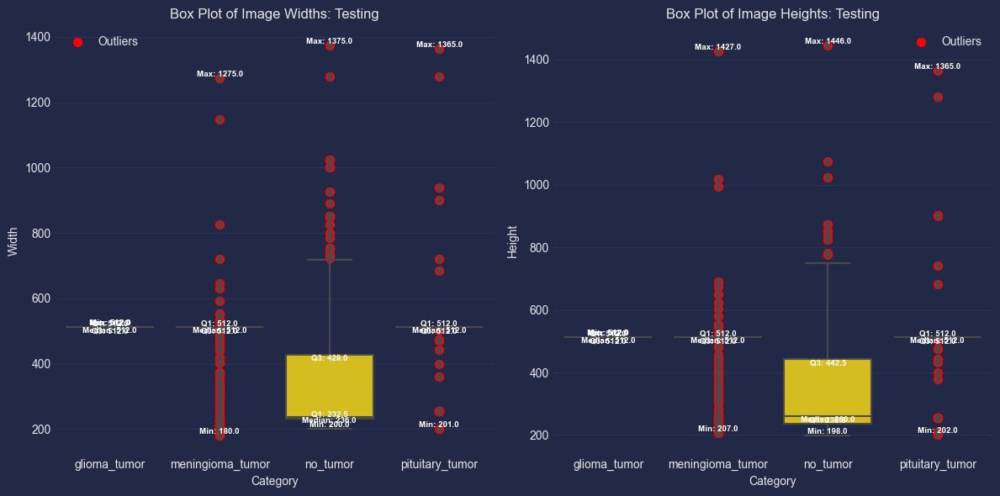



Statistics for Image Widths: 


                  count        mean         std    min    25%    50%    75%  \
Category                                                                      
glioma_tumor      826.0  512.000000    0.000000  512.0  512.0  512.0  512.0   
meningioma_tumor  822.0  480.599757   96.277887  180.0  512.0  512.0  512.0   
no_tumor          395.0  349.663291  202.259585  200.0  232.5  236.0  428.0   
pituitary_tumor   827.0  510.074970   58.344756  201.0  512.0  512.0  512.0   

                     max  
Category                  
glioma_tumor       512.0  
meningioma_tumor  1275.0  
no_tumor          1375.0  
pituitary_tumor   1365.0  




Statistics for Image Heights: 


                  count        mean         std    min    25%    50%    75%  \
Category                                                                      
glioma_tumor      826.0  512.000000    0.000000  512.0  512.0  512.0  512.0   
meningioma_tumor  822.0  483.686131   92.077464  207.0 

In [37]:
df = plot_image_dimensions_boxplot(dataset_path)

# Printing the statistics
statistics_width = df.groupby('Category')['Width'].describe()
statistics_height = df.groupby('Category')['Height'].describe()

# Text Formatting
bold = '\033[1m'
reset = '\033[0m'

# Print with bold style
print('\n')
print(bold + "Statistics for Image Widths: " + reset)
print('\n')
print(statistics_width)
print('\n')
print('\n')
print(bold + "Statistics for Image Heights: " + reset)
print('\n')
print(statistics_height)


### Box Plot: Testing Dataset

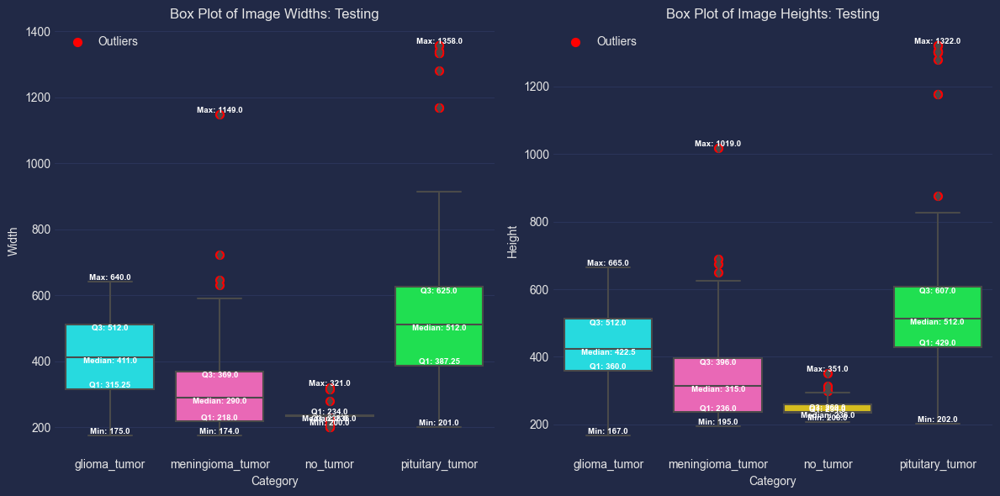

In [39]:
# Path to dataset directory
dataset_path = "C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Testing"

# Function to plot box plots of image dimensions with outliers labeled
def plot_image_dimensions_boxplot(dataset_path):
    widths, heights, categories_list = [], [], []
    categories = os.listdir(dataset_path)
    
    for category in categories:
        category_path = os.path.join(dataset_path, category)
        for image_name in os.listdir(category_path):
            img_path = os.path.join(category_path, image_name)
            try:
                img = Image.open(img_path)
                widths.append(img.width)
                heights.append(img.height)
                categories_list.append(category)
            except Exception as e:
                print(f"Error opening image {img_path}: {e}")
    
    df = pd.DataFrame({'Width': widths, 'Height': heights, 'Category': categories_list})
    
    plt.figure(figsize=(12, 6))
    
    # Plot for Image Widths
    plt.subplot(1, 2, 1)
    sns.boxplot(x='Category', y='Width', data=df)
    plt.title('Box Plot of Image Widths: Testing')
    
    # Annotate with statistics (min, Q1, median, Q3, max) and outliers
    statistics_width = df.groupby('Category')['Width'].describe()
    outliers_plotted = False
    for i, category in enumerate(df['Category'].unique()):
        min_val = statistics_width.loc[category, 'min']
        q1_val = statistics_width.loc[category, '25%']
        median_val = statistics_width.loc[category, '50%']
        q3_val = statistics_width.loc[category, '75%']
        max_val = statistics_width.loc[category, 'max']
        outliers = df[(df['Category'] == category) & ((df['Width'] < q1_val - 1.5 * (q3_val - q1_val)) | (df['Width'] > q3_val + 1.5 * (q3_val - q1_val)))]['Width']
        
        plt.text(i, min_val, f'Min: {min_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        plt.text(i, q1_val, f'Q1: {q1_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        plt.text(i, median_val, f'Median: {median_val}', horizontalalignment='center', verticalalignment='top', size=7, color='white', weight='semibold')
        plt.text(i, q3_val, f'Q3: {q3_val}', horizontalalignment='center', verticalalignment='top', size=7, color='white', weight='semibold')
        plt.text(i, max_val, f'Max: {max_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        if not outliers.empty:
            if not outliers_plotted:
                plt.scatter([i] * len(outliers), outliers, color='red', marker='o', s=50, label='Outliers')
                outliers_plotted = True
            else:
                plt.scatter([i] * len(outliers), outliers, color='red', marker='o', s=50)
    
    plt.legend()
    
    # Plot for Image Heights
    plt.subplot(1, 2, 2)
    sns.boxplot(x='Category', y='Height', data=df)
    plt.title('Box Plot of Image Heights: Testing')
    
    # Annotate with statistics (min, Q1, median, Q3, max) and outliers
    statistics_height = df.groupby('Category')['Height'].describe()
    outliers_plotted = False
    for i, category in enumerate(df['Category'].unique()):
        min_val = statistics_height.loc[category, 'min']
        q1_val = statistics_height.loc[category, '25%']
        median_val = statistics_height.loc[category, '50%']
        q3_val = statistics_height.loc[category, '75%']
        max_val = statistics_height.loc[category, 'max']
        outliers = df[(df['Category'] == category) & ((df['Height'] < q1_val - 1.5 * (q3_val - q1_val)) | (df['Height'] > q3_val + 1.5 * (q3_val - q1_val)))]['Height']
        
        plt.text(i, min_val, f'Min: {min_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        plt.text(i, q1_val, f'Q1: {q1_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        plt.text(i, median_val, f'Median: {median_val}', horizontalalignment='center', verticalalignment='top', size=7, color='white', weight='semibold')
        plt.text(i, q3_val, f'Q3: {q3_val}', horizontalalignment='center', verticalalignment='top', size=7, color='white', weight='semibold')
        plt.text(i, max_val, f'Max: {max_val}', horizontalalignment='center', verticalalignment='bottom', size=7, color='white', weight='semibold')
        if not outliers.empty:
            if not outliers_plotted:
                plt.scatter([i] * len(outliers), outliers, color='red', marker='o', s=50, label='Outliers')
                outliers_plotted = True
            else:
                plt.scatter([i] * len(outliers), outliers, color='red', marker='o', s=50)
    
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Return the dataframe
    return df

# Example usage:
df = plot_image_dimensions_boxplot(dataset_path)


### Box Plot: Results of Testing Dataset

In [41]:
def print_boxplot_statistics(df):
    print("Box Plot Statistics for Image Widths and Heights\n")
    
    # Statistics for Widths
    print("Image Widths:")
    statistics_width = df.groupby('Category')['Width'].describe()
    for category in df['Category'].unique():
        min_val = statistics_width.loc[category, 'min']
        q1_val = statistics_width.loc[category, '25%']
        median_val = statistics_width.loc[category, '50%']
        q3_val = statistics_width.loc[category, '75%']
        max_val = statistics_width.loc[category, 'max']
        outliers = df[(df['Category'] == category) & ((df['Width'] < q1_val - 1.5 * (q3_val - q1_val)) | (df['Width'] > q3_val + 1.5 * (q3_val - q1_val)))]['Width']
        
        print(f"Category: {category}")
        print(f"  Min: {min_val}, Q1: {q1_val}, Median: {median_val}, Q3: {q3_val}, Max: {max_val}, Outliers: {len(outliers)}")
    
    print("\nImage Heights:")
    statistics_height = df.groupby('Category')['Height'].describe()
    for category in df['Category'].unique():
        min_val = statistics_height.loc[category, 'min']
        q1_val = statistics_height.loc[category, '25%']
        median_val = statistics_height.loc[category, '50%']
        q3_val = statistics_height.loc[category, '75%']
        max_val = statistics_height.loc[category, 'max']
        outliers = df[(df['Category'] == category) & ((df['Height'] < q1_val - 1.5 * (q3_val - q1_val)) | (df['Height'] > q3_val + 1.5 * (q3_val - q1_val)))]['Height']
        
        print(f"Category: {category}")
        print(f"  Min: {min_val}, Q1: {q1_val}, Median: {median_val}, Q3: {q3_val}, Max: {max_val}, Outliers: {len(outliers)}")

# Example usage:
print_boxplot_statistics(df)


Box Plot Statistics for Image Widths and Heights

Image Widths:
Category: glioma_tumor
  Min: 175.0, Q1: 315.25, Median: 411.0, Q3: 512.0, Max: 640.0, Outliers: 0
Category: meningioma_tumor
  Min: 174.0, Q1: 218.0, Median: 290.0, Q3: 369.0, Max: 1149.0, Outliers: 4
Category: no_tumor
  Min: 200.0, Q1: 234.0, Median: 236.0, Q3: 236.0, Max: 321.0, Outliers: 25
Category: pituitary_tumor
  Min: 201.0, Q1: 387.25, Median: 512.0, Q3: 625.0, Max: 1358.0, Outliers: 11

Image Heights:
Category: glioma_tumor
  Min: 167.0, Q1: 360.0, Median: 422.5, Q3: 512.0, Max: 665.0, Outliers: 0
Category: meningioma_tumor
  Min: 195.0, Q1: 236.0, Median: 315.0, Q3: 396.0, Max: 1019.0, Outliers: 4
Category: no_tumor
  Min: 208.0, Q1: 234.0, Median: 236.0, Q3: 260.0, Max: 351.0, Outliers: 5
Category: pituitary_tumor
  Min: 202.0, Q1: 429.0, Median: 512.0, Q3: 607.0, Max: 1322.0, Outliers: 12


#### Observations:

#### No Tumor:
- Width: Min: 200.0, Q1: 234.0, Median: 236.0, Q3: 236.0, Max: 321.0, Outliers: 25
- Height: Min: 208.0, Q1: 234.0, Median: 236.0, Q3: 260.0, Max: 351.0, Outliers: 5

Both the width and height of images range from approximately 200 to 351 pixels, with median values around 236 pixels.

#### Pituitary Tumor:
- Width: Min: 201.0, Q1: 387.25, Median: 512.0, Q3: 625.0, Max: 1358.0, Outliers: 11
- Height: Min: 202.0, Q1: 429.0, Median: 512.0, Q3: 607.0, Max: 1322.0, Outliers: 12

Images tend to be larger, with widths ranging from approximately 201 to 1358 pixels and heights from approximately 202 to 1322 pixels. The median values are around 512 pixels for both dimensions.

#### Meningioma Tumor:
- Width: Min: 174.0, Q1: 218.0, Median: 290.0, Q3: 369.0, Max: 1149.0, Outliers: 4
- Height: Min: 195.0, Q1: 236.0, Median: 315.0, Q3: 396.0, Max: 1019.0, Outliers: 4

The dimensions show variability, with widths ranging from approximately 174 to 1149 pixels and heights from approximately 195 to 1019 pixels. Median values are around 290 pixels for width and 315 pixels for height.

#### Glioma Tumor:
- Width: Min: 175.0, Q1: 315.25, Median: 411.0, Q3: 512.0, Max: 640.0, Outliers: 0
- Height: Min: 167.0, Q1: 360.0, Median: 422.5, Q3: 512.0, Max: 665.0, Outliers: 0

Images have widths ranging from approximately 175 to 640 pixels and heights from approximately 167 to 665 pixels, with median values around 411 pixels for width and 422.5 pixels for height.

#### Outliers:

Outliers are present in all categories, with the "no_tumor" and "pituitary_tumor" categories having the highest number of outliers for width and height respectively. These are images whose dimensions fall outside the typical range of the data. Identification of any potential data preprocessing steps needed to standardize image sizes for consistent input into machine learning models.

#### Statistics of Testing Dataset

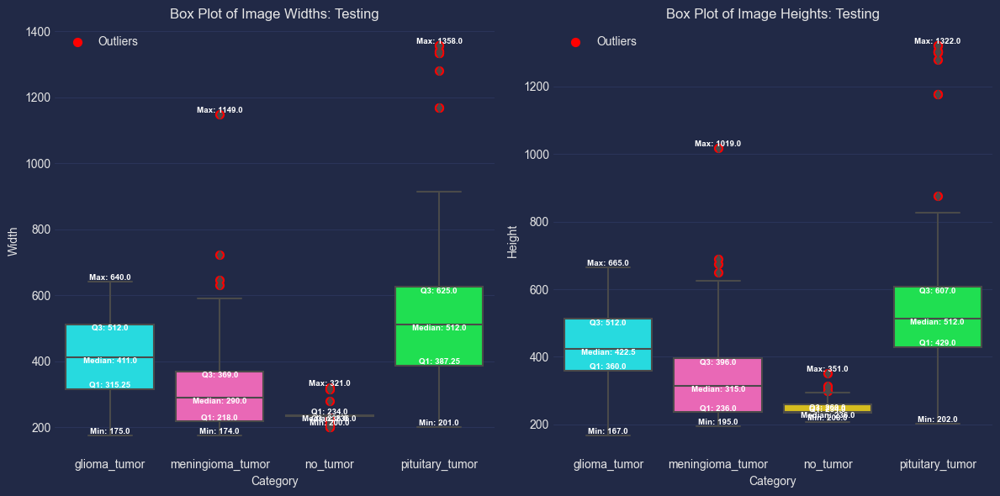



Statistics for Image Widths: 


                  count        mean         std    min     25%    50%    75%  \
Category                                                                       
glioma_tumor      100.0  407.750000  124.071287  175.0  315.25  411.0  512.0   
meningioma_tumor  115.0  323.521739  142.224578  174.0  218.00  290.0  369.0   
no_tumor          105.0  233.809524   17.934762  200.0  234.00  236.0  236.0   
pituitary_tumor    74.0  597.716216  345.039466  201.0  387.25  512.0  625.0   

                     max  
Category                  
glioma_tumor       640.0  
meningioma_tumor  1149.0  
no_tumor           321.0  
pituitary_tumor   1358.0  




Statistics for Image Heights: 


                  count        mean         std    min    25%    50%    75%  \
Category                                                                      
glioma_tumor      100.0  428.400000  124.465159  167.0  360.0  422.5  512.0   
meningioma_tumor  115.0  341.591304  134.651395  

In [44]:
df = plot_image_dimensions_boxplot(dataset_path)

# Printing the statistics
statistics_width = df.groupby('Category')['Width'].describe()
statistics_height = df.groupby('Category')['Height'].describe()

# Text Formatting
bold = '\033[1m'
reset = '\033[0m'

# Print with bold style
print('\n')
print(bold + "Statistics for Image Widths: " + reset)
print('\n')
print(statistics_width)
print('\n')
print('\n')
print(bold + "Statistics for Image Heights: " + reset)
print('\n')
print(statistics_height)

#### Pixel Intensity and Histogram

Utilizing pixel intensities in MRI image analysis involves examining the distribution and patterns of pixel values within the images.

- **Image Quality and Contrast**: Observing pixel intensity distributions helps identify variations in image quality and contrast, which can affect classification accuracy.
- **Feature Detection**: Regions with specific intensity patterns can highlight areas of interest, such as tumors or abnormalities.
- **Class Distinction**: Comparing intensity distributions across different classes (e.g., no tumor vs. tumor types) can reveal distinctive patterns or similarities that aid in classification.

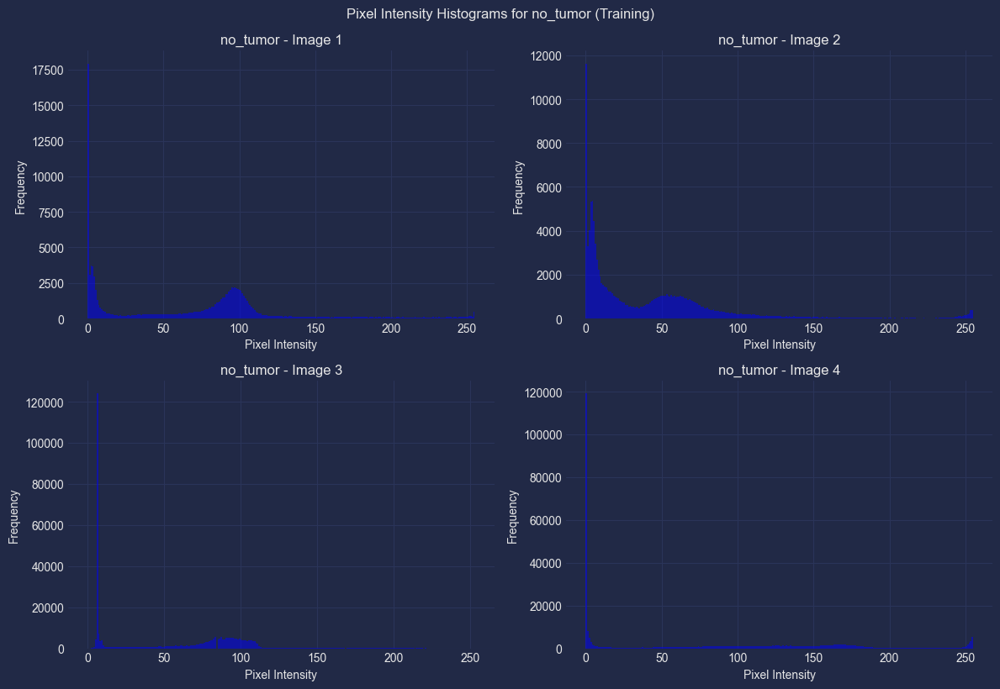

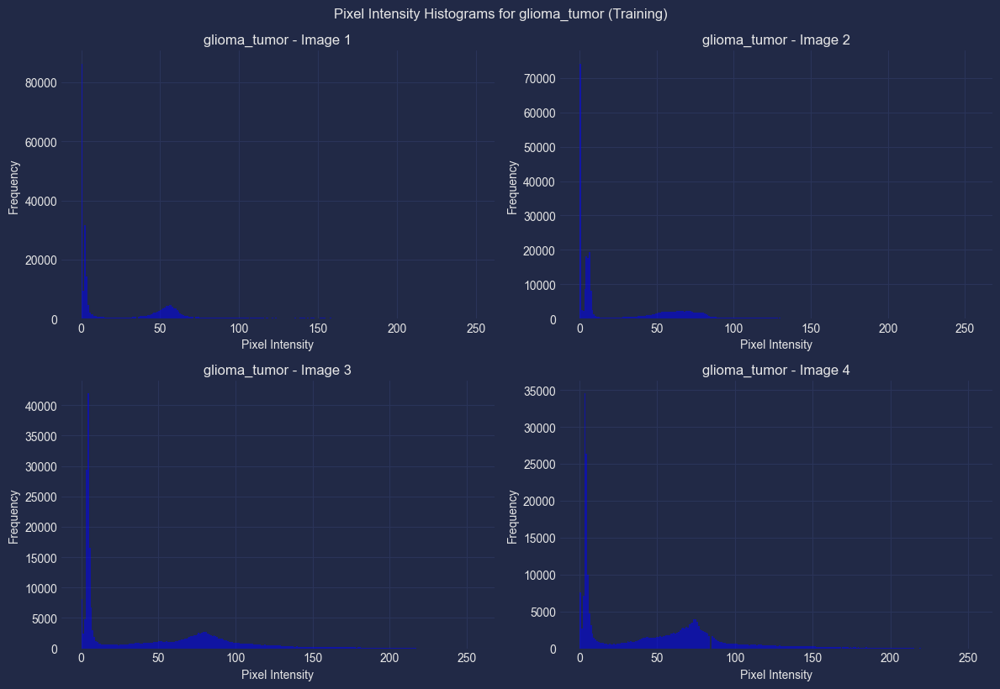

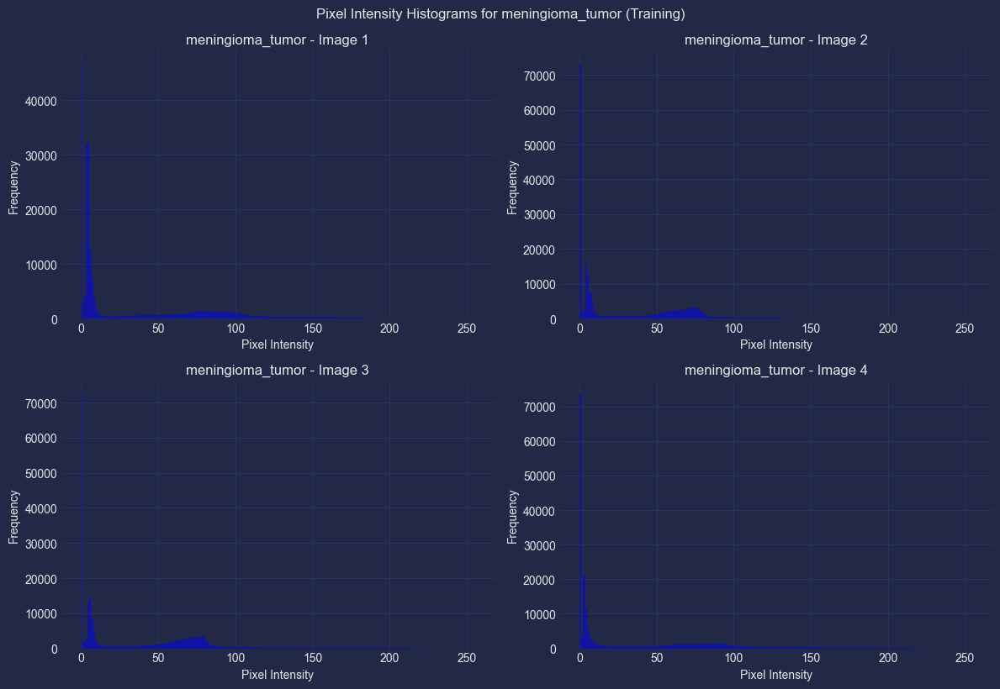

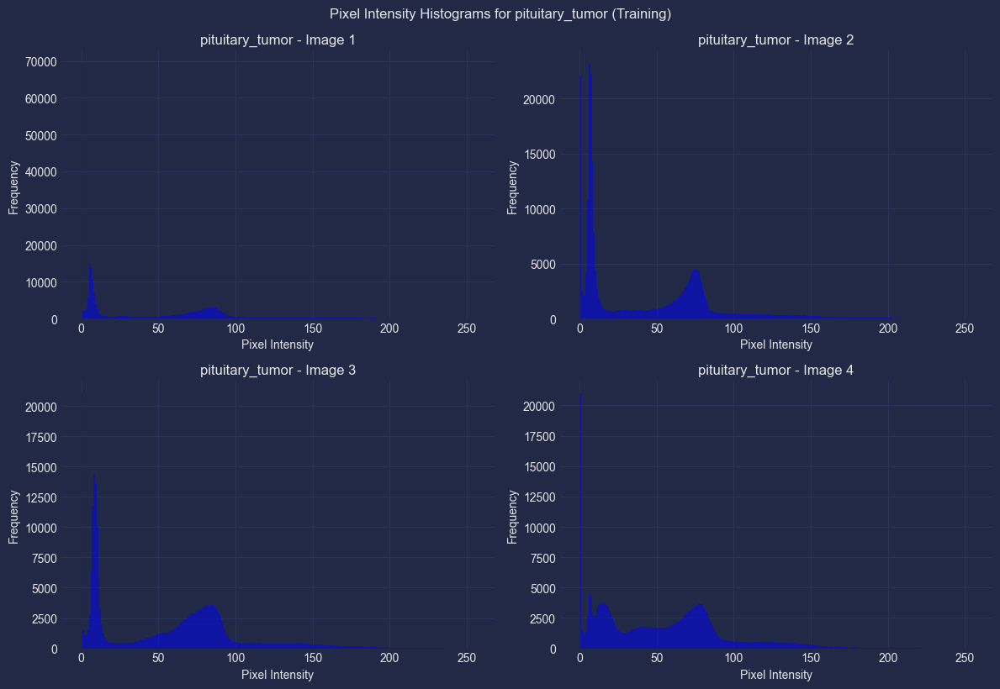

In [46]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# Define paths to each class
base_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training'
classes = ['no_tumor', 'glioma_tumor', 'meningioma_tumor', 'pituitary_tumor']

# Function to get image paths for a given class
def get_image_paths(class_name):
    return glob(os.path.join(base_path, class_name, '*.jpg'))

# Function to plot histograms of pixel intensities in a 2x2 grid
def plot_histograms(class_image_paths, class_name, num_images=4):
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    axes = axes.flatten()
    
    for idx, img_path in enumerate(class_image_paths[:num_images]):
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        ax = axes[idx]
        ax.hist(img.ravel(), bins=256, alpha=0.5, color='blue')
        ax.set_title(f'{class_name} - Image {idx + 1}')
        ax.set_xlabel('Pixel Intensity')
        ax.set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.suptitle(f'Pixel Intensity Histograms for {class_name} (Training)', y=1.02)
    plt.show()

# Plot histograms for each class
for class_name in classes:
    image_paths = get_image_paths(class_name)
    plot_histograms(image_paths, class_name, num_images=4)


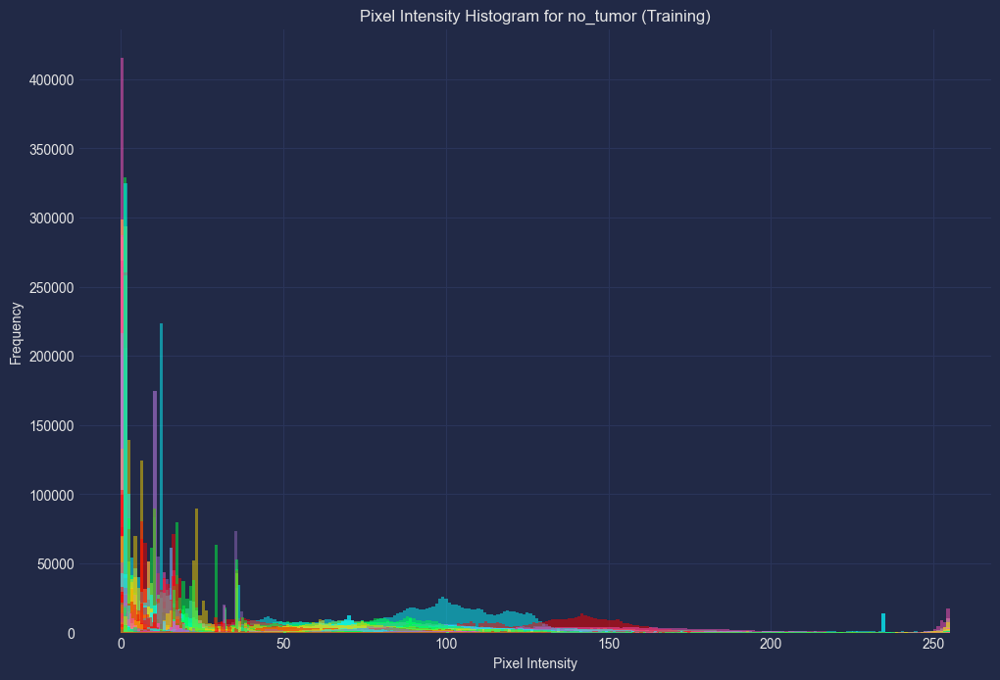

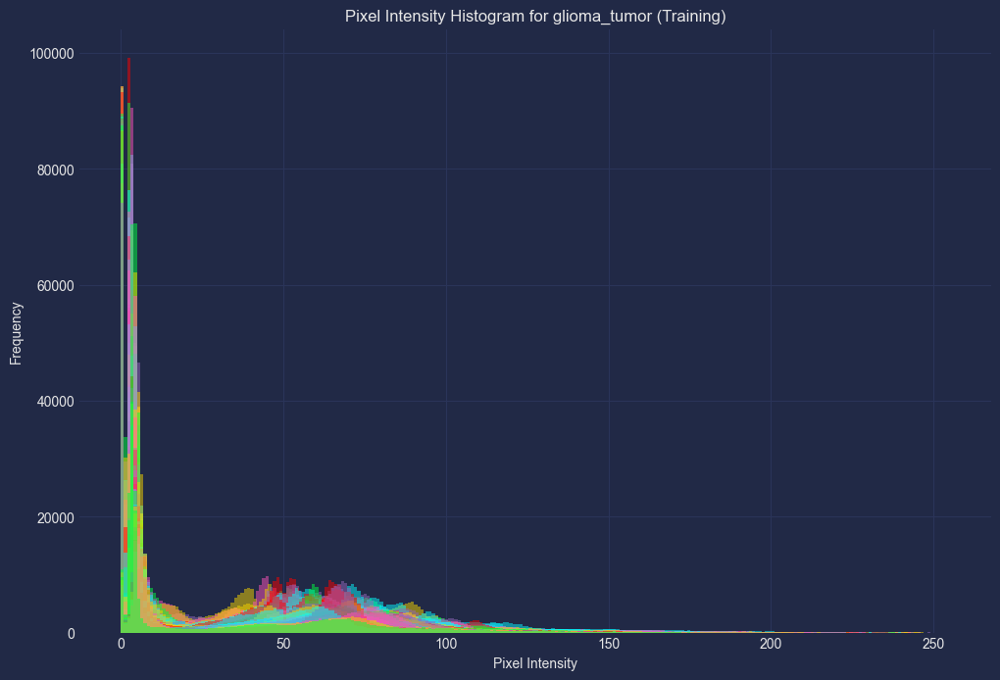

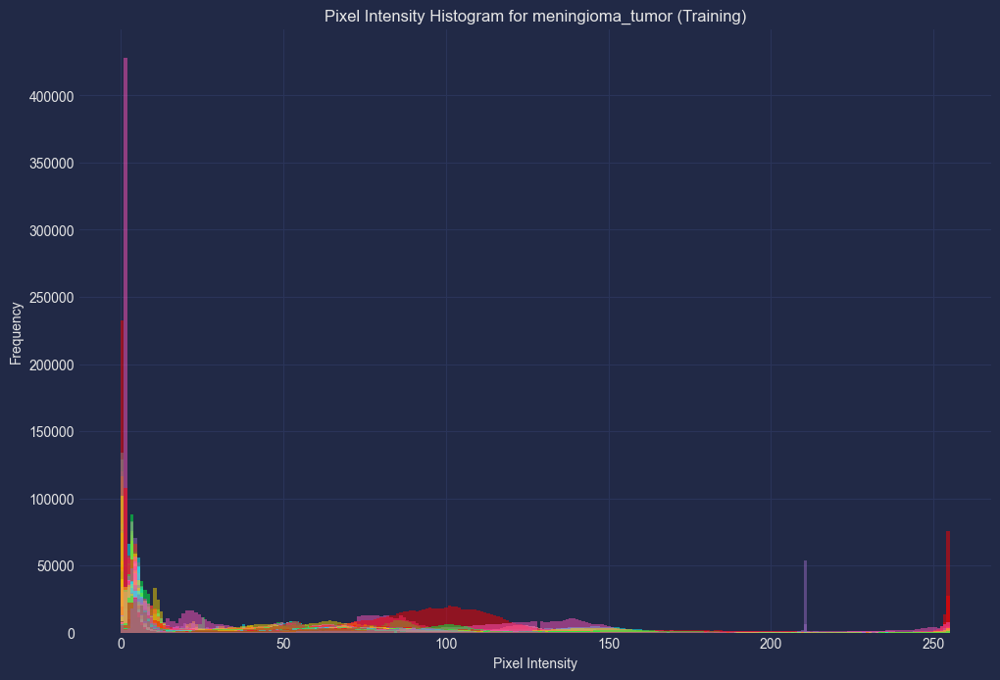

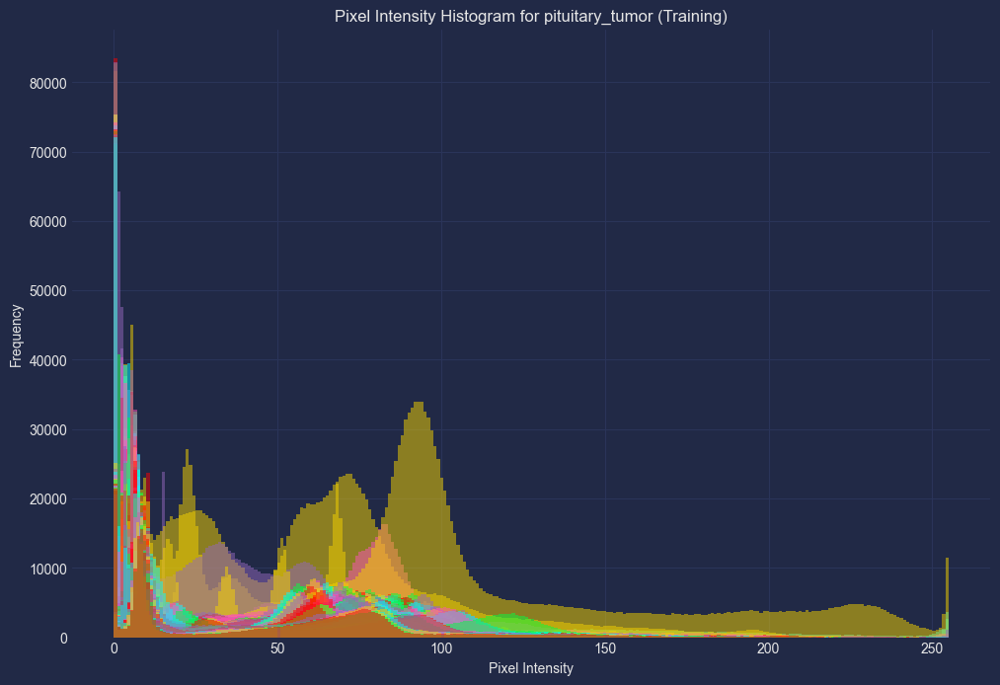

In [47]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# Define paths to each class
base_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training'
classes = ['no_tumor', 'glioma_tumor', 'meningioma_tumor', 'pituitary_tumor']

# Function to get image paths for a given class
def get_image_paths(class_name):
    return glob(os.path.join(base_path, class_name, '*.jpg'))

# Function to plot histograms of pixel intensities
def plot_histograms(class_image_paths, class_name):
    plt.figure(figsize=(12, 8))
    for img_path in class_image_paths:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        plt.hist(img.ravel(), bins=256, alpha=0.5, label=class_name)
    plt.title(f'Pixel Intensity Histogram for {class_name} (Training)')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    #plt.legend(loc='upper right')
    plt.show()

# Plot histograms for each class
for class_name in classes:
    image_paths = get_image_paths(class_name)
    plot_histograms(image_paths, class_name)


#### Observation

- Pixel variation is elevated on the pituitary_tumor class. Indication that due to numerous outliers within Testing Dataset, pixel intensity would be significantly higher on each dataset particularly within meningioma_tumor and pituitary_tumor class.

#### Pixel intensities as color map on the grayscale Brain MRI scan image

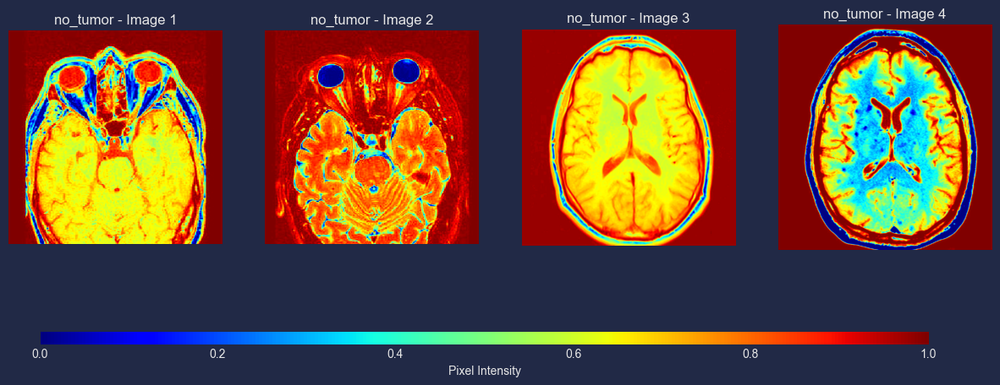

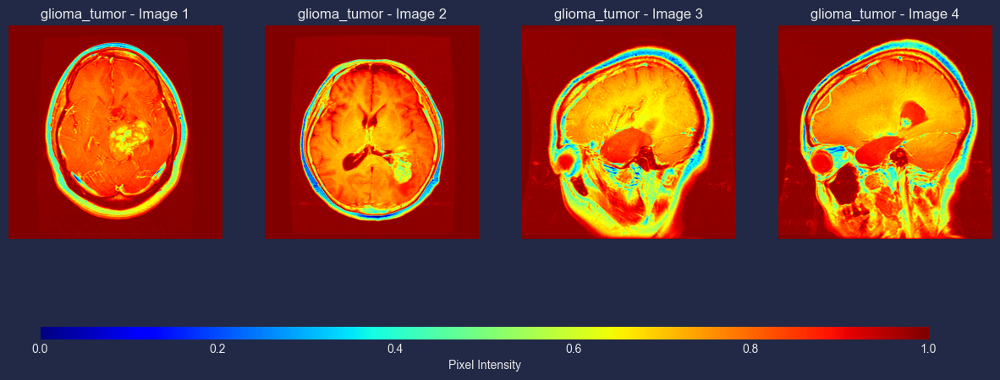

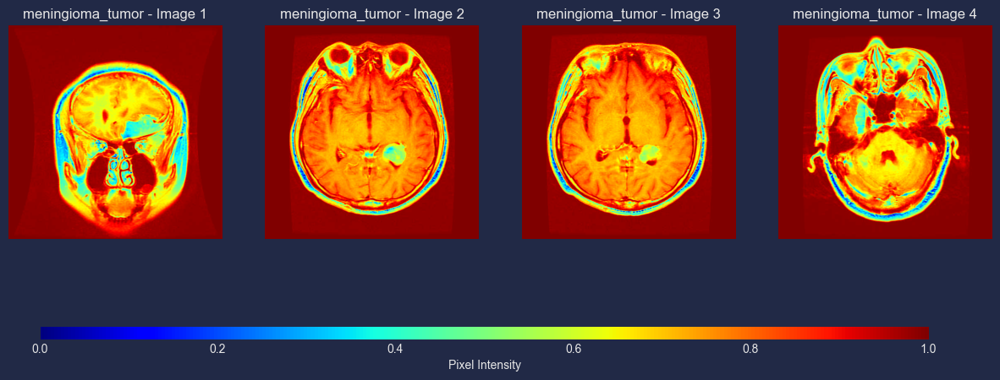

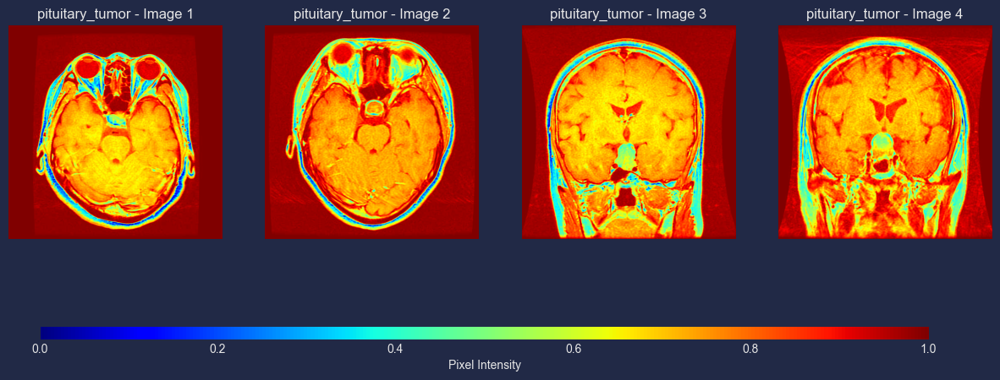

In [50]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# Define paths to each class
base_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training'
classes = ['no_tumor', 'glioma_tumor', 'meningioma_tumor', 'pituitary_tumor']

# Function to get image paths for a given class
def get_image_paths(class_name):
    return glob(os.path.join(base_path, class_name, '*.jpg'))

# Function to overlay pixel intensities on top of example images and plot them in a grid
def overlay_pixel_intensities_grid(class_image_paths, class_name, num_images=3):
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    
    for idx, img_path in enumerate(class_image_paths[:num_images]):
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        
        # Create a color map overlay
        colored_img = cv2.applyColorMap(img, cv2.COLORMAP_JET)
        
        axes[idx].imshow(colored_img)
        axes[idx].set_title(f'{class_name} - Image {idx + 1}')
        axes[idx].axis('off')
    
    # Adjust the space to add the color bar
    plt.subplots_adjust(bottom=0.2)
    
    # Add a color bar as legend below the images
    cbar_ax = fig.add_axes([0.15, 0.05, 0.7, 0.03])  # [left, bottom, width, height]
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap='jet'), cax=cbar_ax, orientation='horizontal')
    cbar.set_label('Pixel Intensity')
    
    plt.show()

# Plot overlay for each class in a grid
for class_name in classes:
    image_paths = get_image_paths(class_name)
    overlay_pixel_intensities_grid(image_paths, class_name, num_images=4)


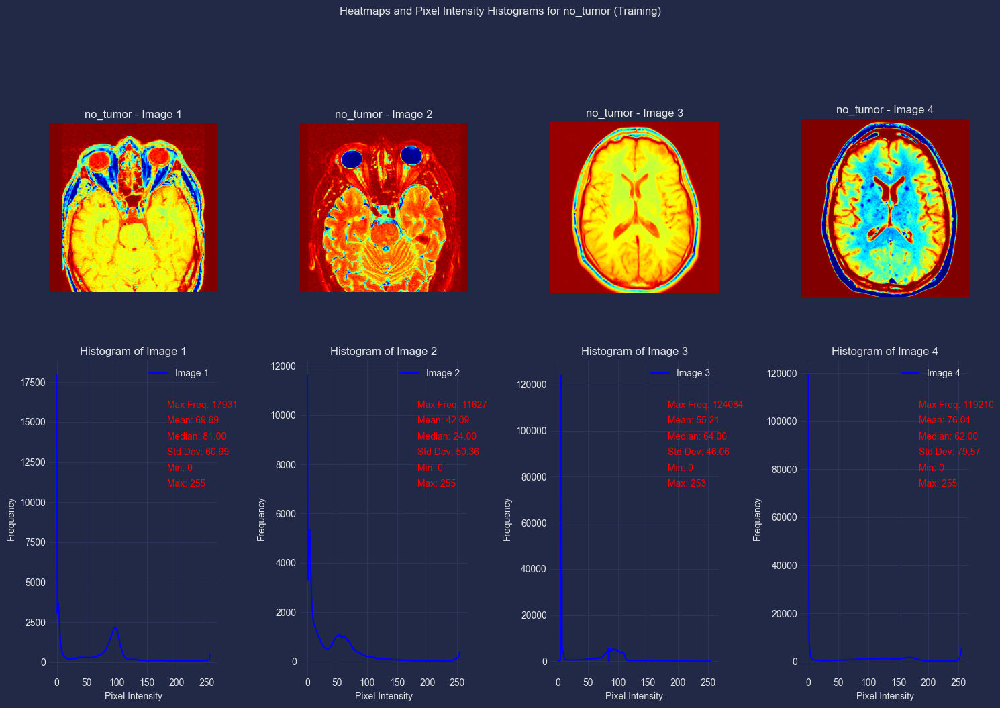

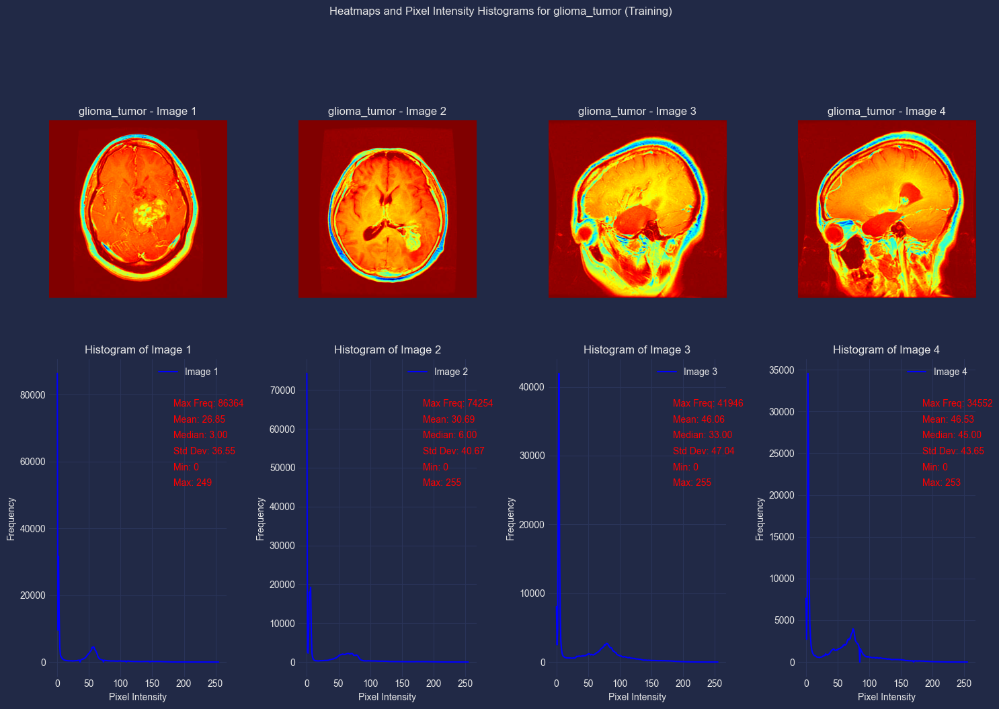

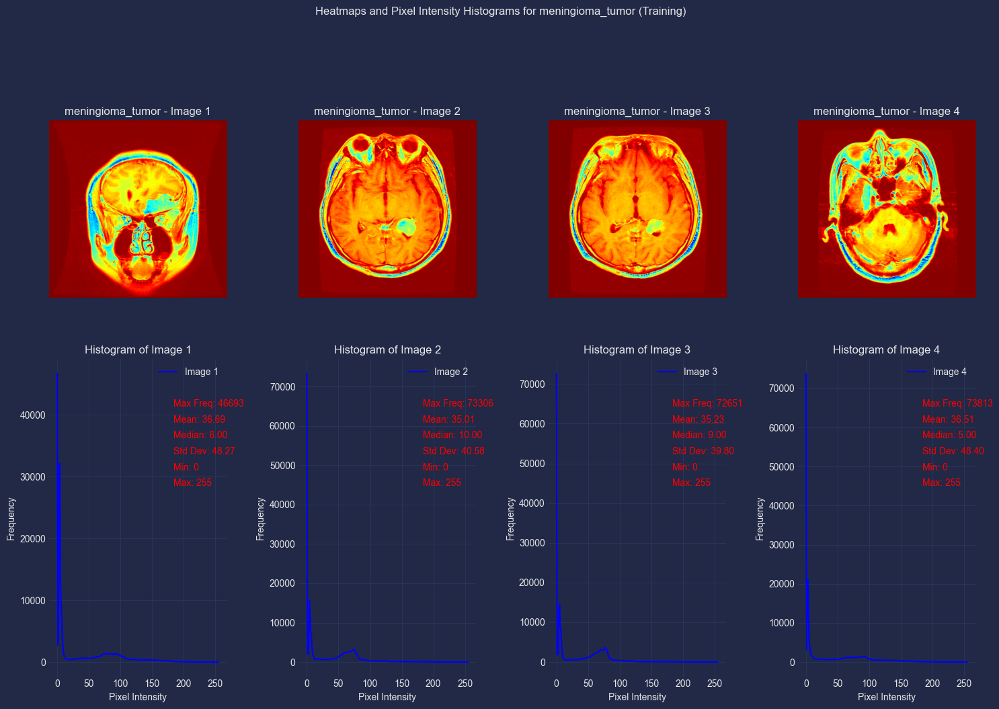

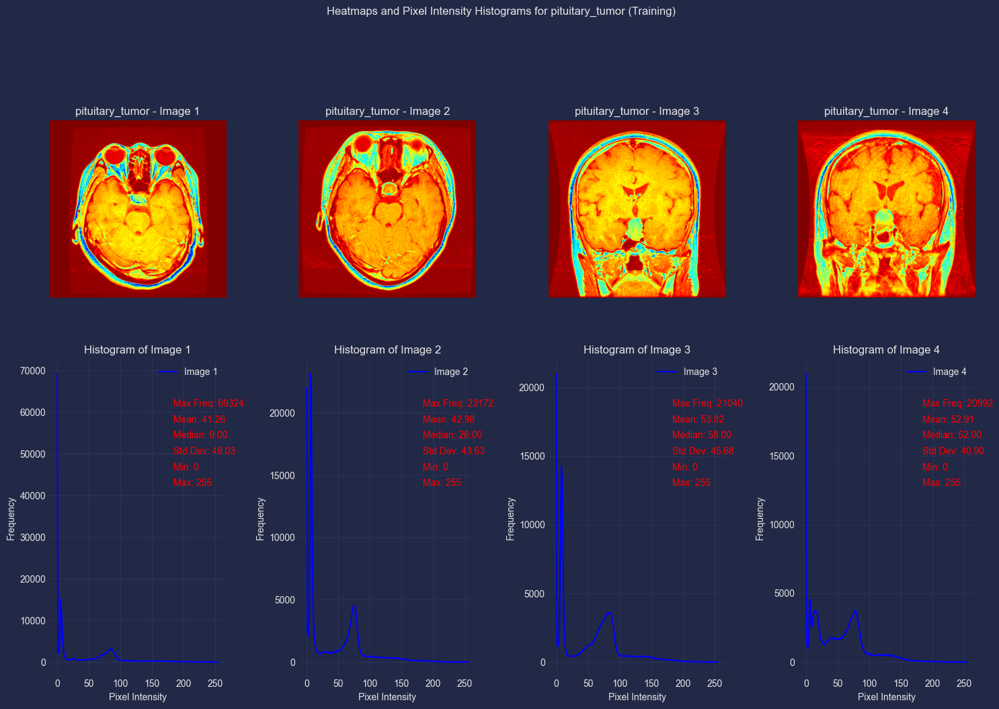

In [51]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

# Define paths to each class
base_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training'
classes = ['no_tumor', 'glioma_tumor', 'meningioma_tumor', 'pituitary_tumor']

# Function to get image paths for a given class
def get_image_paths(class_name, max_images=10):
    return glob(os.path.join(base_path, class_name, '*.jpg'))[:max_images]

# Function to plot heatmaps and histograms of pixel intensities in a 2x2 grid
def plot_heatmaps_histograms(class_image_paths, class_name, num_images=4):
    fig, axes = plt.subplots(2, num_images, figsize=(15, 10))
    
    for idx, img_path in enumerate(class_image_paths[:num_images]):
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue
        
        # Create a color map overlay
        colored_img = cv2.applyColorMap(img, cv2.COLORMAP_JET)
        
        # Plot heatmap
        ax_img = axes[0, idx]
        ax_img.imshow(colored_img)
        ax_img.set_title(f'{class_name} - Image {idx + 1}')
        ax_img.axis('off')
        
        # Plot histogram
        ax_hist = axes[1, idx]
        hist, bins = np.histogram(img.ravel(), bins=256)
        ax_hist.plot(hist, color='blue', label=f'Image {idx + 1}')
        ax_hist.set_title(f'Histogram of Image {idx + 1}')
        ax_hist.set_xlabel('Pixel Intensity')
        ax_hist.set_ylabel('Frequency')
        ax_hist.legend(loc='upper right')
        
        # Calculate statistics
        max_freq = np.max(hist)
        mean_intensity = np.mean(img)
        median_intensity = np.median(img)
        std_intensity = np.std(img)
        min_intensity = np.min(img)
        max_intensity = np.max(img)
        
        # Add annotations
        ax_hist.annotate(f'Max Freq: {max_freq}', xy=(0.7, 0.85), xycoords='axes fraction', fontsize=10, color='red')
        ax_hist.annotate(f'Mean: {mean_intensity:.2f}', xy=(0.7, 0.80), xycoords='axes fraction', fontsize=10, color='red')
        ax_hist.annotate(f'Median: {median_intensity:.2f}', xy=(0.7, 0.75), xycoords='axes fraction', fontsize=10, color='red')
        ax_hist.annotate(f'Std Dev: {std_intensity:.2f}', xy=(0.7, 0.70), xycoords='axes fraction', fontsize=10, color='red')
        ax_hist.annotate(f'Min: {min_intensity}', xy=(0.7, 0.65), xycoords='axes fraction', fontsize=10, color='red')
        ax_hist.annotate(f'Max: {max_intensity}', xy=(0.7, 0.60), xycoords='axes fraction', fontsize=10, color='red')
    
    plt.tight_layout()
    plt.suptitle(f'Heatmaps and Pixel Intensity Histograms for {class_name} (Training)', y=1.05)
    plt.show()

# Plot heatmaps and histograms for each class
for class_name in classes:
    image_paths = get_image_paths(class_name, max_images=10)
    plot_heatmaps_histograms(image_paths, class_name, num_images=4)


#### Observations

- Due heatmap being implemented onto the image, tumor can be easily identified within image due to the nature of heatmap highlighting areas of abnormalities/proliferation of pixel intensisty that would not be typically seen within the region, an examplar would be referencing to no_tumor class.

In [53]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import ipywidgets as widgets
from IPython.display import display

# Define paths to each class
base_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training'
classes = ['no_tumor', 'glioma_tumor', 'meningioma_tumor', 'pituitary_tumor']

# Function to get image paths for a given class
def get_image_paths(class_name, max_images=10):
    return glob(os.path.join(base_path, class_name, '*.jpg'))[:max_images]

# Function to plot heatmaps and histograms of pixel intensities in a 2x2 grid
def plot_heatmaps_histograms(class_image_paths, class_name, num_images=4, intensity=1.0):
    fig, axes = plt.subplots(2, num_images, figsize=(15, 10))
    
    for idx, img_path in enumerate(class_image_paths[:num_images]):
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue
        
        # Adjust intensity
        adjusted_img = cv2.convertScaleAbs(img, alpha=intensity, beta=0)
        # Create a color map overlay
        colored_img = cv2.applyColorMap(adjusted_img, cv2.COLORMAP_JET)
        
        # Plot heatmap
        ax_img = axes[0, idx]
        ax_img.imshow(colored_img)
        ax_img.set_title(f'{class_name} - Image {idx + 1}')
        ax_img.axis('off')
        
        # Plot histogram
        ax_hist = axes[1, idx]
        hist, bins = np.histogram(adjusted_img.ravel(), bins=256)
        ax_hist.plot(hist, color='blue', label=f'Image {idx + 1}')
        ax_hist.set_title(f'Histogram of Image {idx + 1}')
        ax_hist.set_xlabel('Pixel Intensity')
        ax_hist.set_ylabel('Frequency')
        ax_hist.legend(loc='upper right')
        
        # Calculate statistics
        max_freq = np.max(hist)
        mean_intensity = np.mean(adjusted_img)
        median_intensity = np.median(adjusted_img)
        std_intensity = np.std(adjusted_img)
        min_intensity = np.min(adjusted_img)
        max_intensity = np.max(adjusted_img)
        
        # Add annotations
        ax_hist.annotate(f'Max Freq: {max_freq}', xy=(0.7, 0.85), xycoords='axes fraction', fontsize=10, color='red')
        ax_hist.annotate(f'Mean: {mean_intensity:.2f}', xy=(0.7, 0.80), xycoords='axes fraction', fontsize=10, color='red')
        ax_hist.annotate(f'Median: {median_intensity:.2f}', xy=(0.7, 0.75), xycoords='axes fraction', fontsize=10, color='red')
        ax_hist.annotate(f'Std Dev: {std_intensity:.2f}', xy=(0.7, 0.70), xycoords='axes fraction', fontsize=10, color='red')
        ax_hist.annotate(f'Min: {min_intensity}', xy=(0.7, 0.65), xycoords='axes fraction', fontsize=10, color='red')
        ax_hist.annotate(f'Max: {max_intensity}', xy=(0.7, 0.60), xycoords='axes fraction', fontsize=10, color='red')
    
    plt.tight_layout()
    plt.suptitle(f'Heatmaps and Pixel Intensity Histograms for {class_name} (Training)', y=1.05)
    plt.show()

def update_intensity(intensity=1.0):
    for class_name in classes:
        image_paths = get_image_paths(class_name, max_images=10)
        plot_heatmaps_histograms(image_paths, class_name, num_images=4, intensity=intensity)

# Create an intensity slider
intensity_slider = widgets.FloatSlider(value=1.0, min=0.1, max=3.0, step=0.1, description='Intensity:')
widgets.interactive(update_intensity, intensity=intensity_slider)


interactive(children=(FloatSlider(value=1.0, description='Intensity:', max=3.0, min=0.1), Output()), _dom_clas…

### Texture Analysis

Compute texture features (e.g., contrast, homogeneity, entropy) for images in each category. Texture features can provide additional insights into the differences between tumor types.

**Original Brain Tumor Scan: Each Classes (Training Dataset)**

                     Contrast  Homogeneity   Entropy
Label                                               
glioma_tumor      1383.891329     0.350646  3.825047
meningioma_tumor  2009.708130     0.304202  4.062224
no_tumor          2819.344049     0.270095  4.082531
pituitary_tumor   1884.426127     0.191245  4.403200


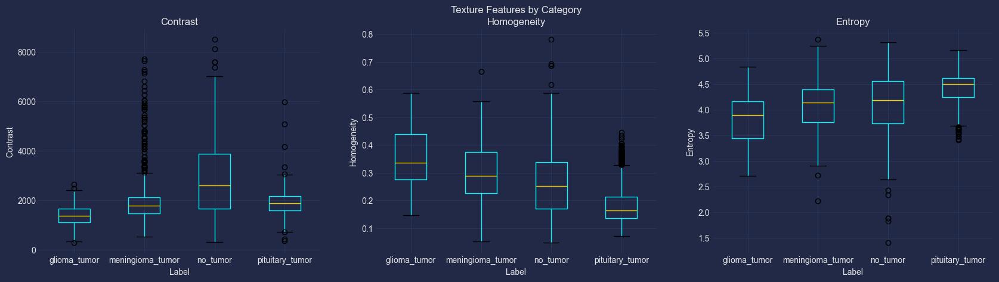

In [60]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage.feature import graycomatrix, graycoprops
from scipy.stats import entropy

# Define paths
data_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training'
labels = ['no_tumor', 'pituitary_tumor', 'meningioma_tumor', 'glioma_tumor']

# Load data and labels
data = []
labels_list = []

for label in labels:
    folder_path = os.path.join(data_path, label)
    for img_name in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            img = cv2.resize(img, (128, 128))
            data.append(img)
            labels_list.append(label)

data = np.array(data)
labels_list = np.array(labels_list)

# Encode labels
label_mapping = {label: idx for idx, label in enumerate(labels)}
encoded_labels = np.array([label_mapping[label] for label in labels_list])

# Define a function to extract texture features
def extract_texture_features(image):
    glcm = graycomatrix(image, distances=[5], angles=[0], levels=256, symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
    
    # Calculate entropy
    hist, _ = np.histogram(image, bins=256, range=(0, 256), density=True)
    ent = entropy(hist + 1e-6)  # Adding a small value to avoid log(0)

    return contrast, homogeneity, ent

# Extract texture features for all images
texture_features = []
for img in data:
    features = extract_texture_features(img)
    texture_features.append(features)

texture_features = np.array(texture_features)

# Create a DataFrame to store texture features
texture_df = pd.DataFrame(texture_features, columns=['Contrast', 'Homogeneity', 'Entropy'])
texture_df['Label'] = labels_list

# Display texture features for each category
print(texture_df.groupby('Label').mean())

# Visualize texture features
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# Plot Contrast
texture_df.boxplot(column='Contrast', by='Label', ax=axes[0])
axes[0].set_title('Contrast')
axes[0].set_ylabel('Contrast')

# Plot Homogeneity
texture_df.boxplot(column='Homogeneity', by='Label', ax=axes[1])
axes[1].set_title('Homogeneity')
axes[1].set_ylabel('Homogeneity')

# Plot Entropy
texture_df.boxplot(column='Entropy', by='Label', ax=axes[2])
axes[2].set_title('Entropy')
axes[2].set_ylabel('Entropy')

plt.suptitle('Texture Features by Category')
plt.show()


#### Violin Plots:

Violin plots combine aspects of box plots and density plots to provide a more comprehensive view of the data distribution.

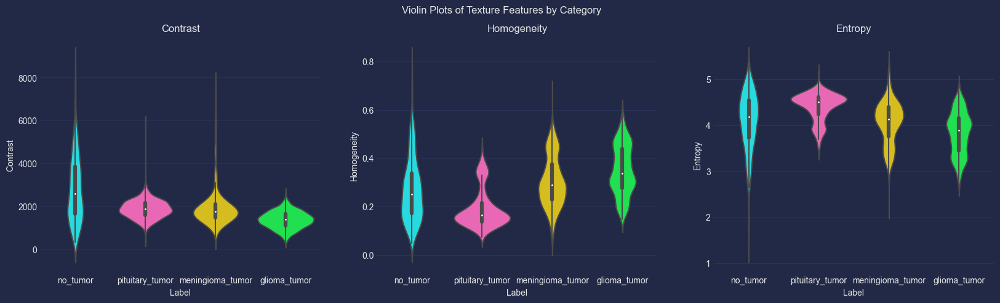

In [63]:
import seaborn as sns

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

sns.violinplot(x='Label', y='Contrast', data=texture_df, ax=axes[0])
sns.violinplot(x='Label', y='Homogeneity', data=texture_df, ax=axes[1])
sns.violinplot(x='Label', y='Entropy', data=texture_df, ax=axes[2])

axes[0].set_title('Contrast')
axes[1].set_title('Homogeneity')
axes[2].set_title('Entropy')

plt.suptitle('Violin Plots of Texture Features by Category')
plt.show()


C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\User\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


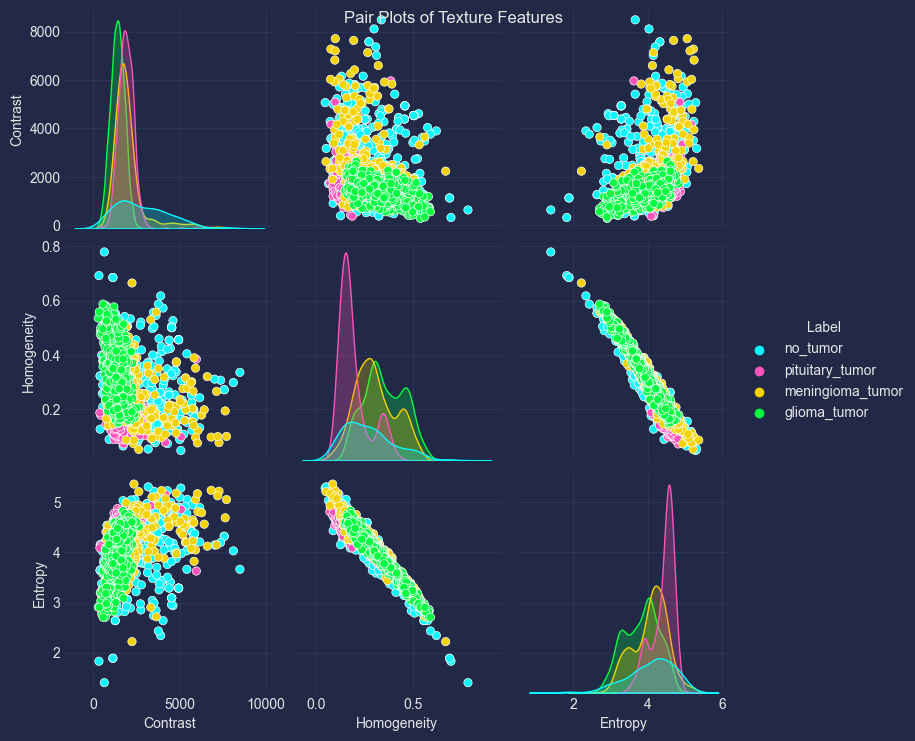

In [66]:
import seaborn as sns

sns.pairplot(texture_df, hue='Label')
plt.suptitle('Pair Plots of Texture Features')
plt.show()


#### Scatter Plots:

Scatter plots can show the relationship between two texture features and how they vary across different labels.

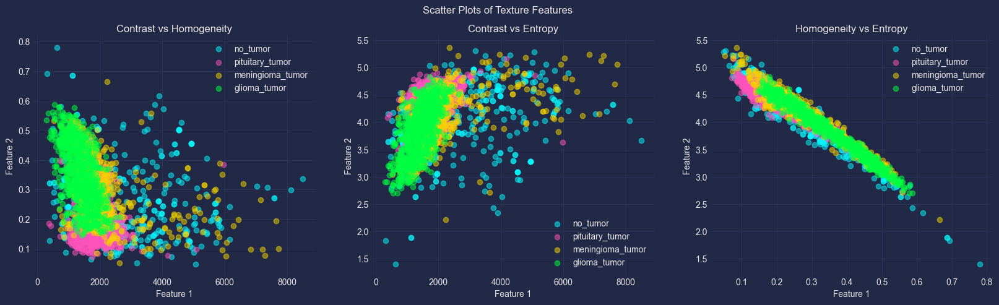

In [70]:
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

for label in labels:
    subset = texture_df[texture_df['Label'] == label]
    axes[0].scatter(subset['Contrast'], subset['Homogeneity'], label=label, alpha=0.5)
    axes[1].scatter(subset['Contrast'], subset['Entropy'], label=label, alpha=0.5)
    axes[2].scatter(subset['Homogeneity'], subset['Entropy'], label=label, alpha=0.5)

axes[0].set_title('Contrast vs Homogeneity')
axes[1].set_title('Contrast vs Entropy')
axes[2].set_title('Homogeneity vs Entropy')

for ax in axes:
    ax.legend()
    ax.set_xlabel('Feature 1')
    ax.set_ylabel('Feature 2')

plt.suptitle('Scatter Plots of Texture Features')
plt.show()


#### Shape Analysis

Shape analysis is used to quantify and analyze the geometrical properties of objects within images. This analysis can provide valuable insights in various fields:

Medical Imaging: Detects and classifies abnormalities such as tumors by analyzing their shape.
Object Recognition: Identifies objects in images based on their shape features.
Quality Control: Ensures products meet specified shape criteria in manufacturing.
Biological Studies: Analyzes the morphology of cells and organisms.
Geographical Analysis: Assesses natural formations and land use patterns.
Shape analysis helps in pattern recognition, classification, and understanding structural variations.

- Comment

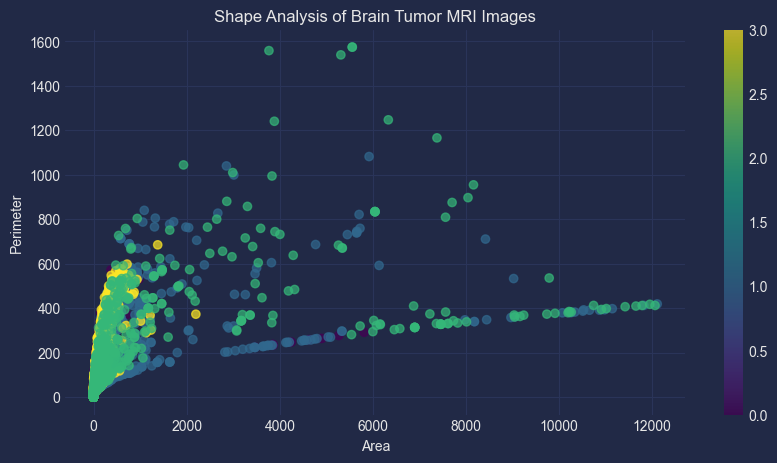

In [74]:
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

#Load the Dataset

# Define the path to the dataset
dataset_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training'

# Load images and labels
images = []
labels = []

for label in ['glioma_tumor', 'meningioma_tumor', 'pituitary_tumor', 'no_tumor']:
    label_path = os.path.join(dataset_path, label)
    for img_name in os.listdir(label_path):
        img_path = os.path.join(label_path, img_name)
        img = cv2.imread(img_path)
        if img is not None:
            images.append(img)
            labels.append(label)
            
def preprocess_image(img):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Resize to a fixed size
    gray = cv2.resize(gray, (128, 128))
    # Apply Gaussian blur
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    # Apply thresholding
    _, thresh = cv2.threshold(blur, 127, 255, cv2.THRESH_BINARY)
    return thresh

preprocessed_images = [preprocess_image(img) for img in images]

def extract_contours(thresh):
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours

contours_list = [extract_contours(img) for img in preprocessed_images]

def calculate_shape_features(contours):
    shape_features = []
    for cnt in contours:
        area = cv2.contourArea(cnt)
        perimeter = cv2.arcLength(cnt, True)
        M = cv2.moments(cnt)
        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])
        else:
            cx, cy = 0, 0
        shape_features.append([area, perimeter, cx, cy])
    return shape_features

shape_features_list = [calculate_shape_features(contours) for contours in contours_list]

import matplotlib.pyplot as plt

# Convert shape features list to a DataFrame
shape_features_df = pd.DataFrame([item for sublist in shape_features_list for item in sublist],
                                 columns=['Area', 'Perimeter', 'CentroidX', 'CentroidY'])

# Add labels to the DataFrame
shape_features_df['Label'] = np.repeat(labels, [len(f) for f in shape_features_list])

# Visualize the shape features
plt.figure(figsize=(10, 5))
plt.scatter(shape_features_df['Area'], shape_features_df['Perimeter'], c=shape_features_df['Label'].astype('category').cat.codes, cmap='viridis', alpha=0.7)
plt.xlabel('Area')
plt.ylabel('Perimeter')
plt.title('Shape Analysis of Brain Tumor MRI Images')
plt.colorbar()
plt.show()


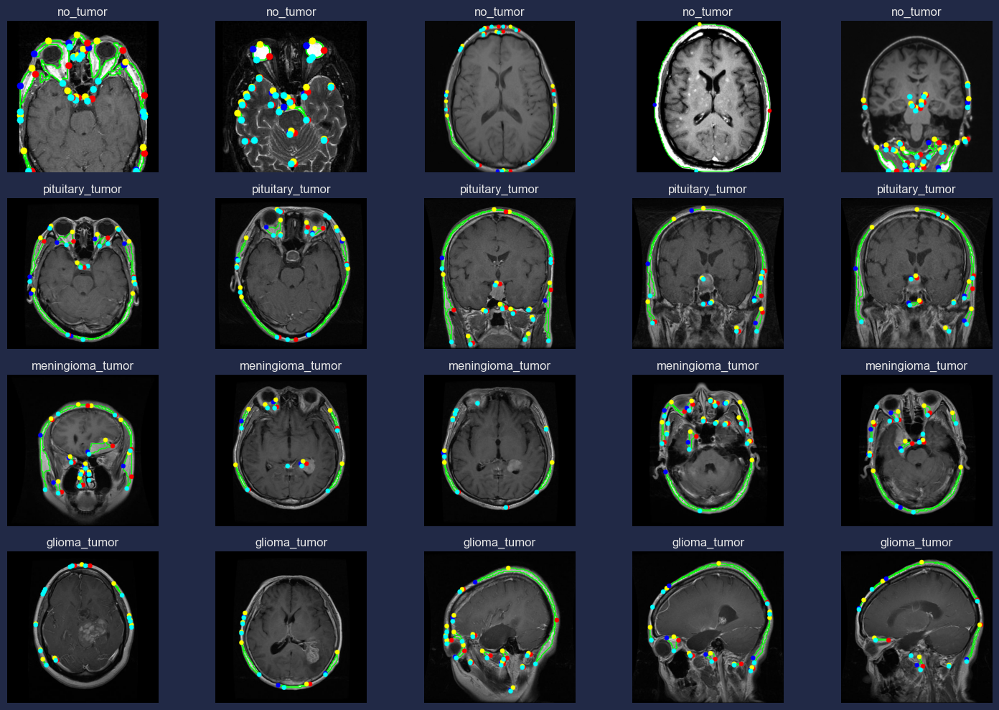

In [76]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define the path to the dataset and labels
dataset_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training'
labels = ['no_tumor', 'pituitary_tumor', 'meningioma_tumor', 'glioma_tumor']

# Load images and labels
sample_images = []
image_labels = []

for label in labels:
    label_path = os.path.join(dataset_path, label)
    for img_name in os.listdir(label_path)[:5]:  # Load 5 images per label
        img_path = os.path.join(label_path, img_name)
        img = cv2.imread(img_path)
        if img is not None:
            sample_images.append(img)
            image_labels.append(label)
        else:
            print(f"Warning: Image at path {img_path} could not be loaded.")

# Preprocess images
def preprocess_image(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray, (128, 128))
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    _, thresh = cv2.threshold(blur, 127, 255, cv2.THRESH_BINARY)
    return thresh

preprocessed_images = [preprocess_image(img) for img in sample_images]

# Extract contours
def extract_contours(thresh):
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours

contours_list = [extract_contours(img) for img in preprocessed_images]

# Draw contours and extreme points on original images
def draw_contours_and_extreme_points(img, contours):
    img_with_contours = img.copy()
    h, w = img_with_contours.shape[:2]
    scale_w, scale_h = w / 128, h / 128
    contours_rescaled = [np.array([[int(point[0][0] * scale_w), int(point[0][1] * scale_h)] for point in cnt]).reshape(-1, 1, 2) for cnt in contours]

    cv2.drawContours(img_with_contours, contours_rescaled, -1, (0, 255, 0), 2)
    
    for cnt in contours_rescaled:
        if len(cnt) > 0:
            # Get extreme points
            ext_left = tuple(cnt[cnt[:, :, 0].argmin()][0])
            ext_right = tuple(cnt[cnt[:, :, 0].argmax()][0])
            ext_top = tuple(cnt[cnt[:, :, 1].argmin()][0])
            ext_bottom = tuple(cnt[cnt[:, :, 1].argmax()][0])
            
            # Draw extreme points
            cv2.circle(img_with_contours, ext_left, 8, (255, 0, 0), -1)
            cv2.circle(img_with_contours, ext_right, 8, (0, 0, 255), -1)
            cv2.circle(img_with_contours, ext_top, 8, (0, 255, 255), -1)
            cv2.circle(img_with_contours, ext_bottom, 8, (255, 255, 0), -1)
    
    return img_with_contours

images_with_contours_and_extremes = [draw_contours_and_extreme_points(img, contours) for img, contours in zip(sample_images, contours_list)]

# Display images with contours and extreme points in a grid
num_images = len(images_with_contours_and_extremes)
cols = 5
rows = (num_images + cols - 1) // cols

plt.figure(figsize=(15, 10))
for i, img_with_contours_and_extremes in enumerate(images_with_contours_and_extremes):
    plt.subplot(rows, cols, i + 1)
    plt.imshow(cv2.cvtColor(img_with_contours_and_extremes, cv2.COLOR_BGR2RGB))
    plt.title(image_labels[i])
    plt.axis('off')
plt.tight_layout()
plt.show()


#### Observation

- An example array pictures of simple contour and extreme-points being employed on multiple images from differnt classes.
- Enabling to comprehend the countor and extreme points markings and boundaries over different images from four classes.
- To identify if there is a probability of contour and extreme points able to distinguish tumor alongside with information of similar spatial shapes within the parameter.

#### Region of Interest (ROI) Analysis

In [79]:
!pip install pandas numpy matplotlib opencv-python scikit-image

       area  bbox_area  eccentricity    perimeter  major_axis_length  \
0  113117.0   145008.0      0.599429  1274.253967         424.375657   
1  107263.0   134248.0      0.474978  1233.928066         394.175177   
2       3.0        6.0      0.973723     1.207107           3.677089   
3       1.0        1.0      0.000000     0.000000           0.000000   
4       2.0        2.0      1.000000     0.000000           2.000000   

   minor_axis_length                  bbox      category  \
0         339.682247    (41, 88, 465, 430)  glioma_tumor   
1         346.873328    (81, 84, 469, 430)  glioma_tumor   
2           0.837402  (434, 106, 437, 108)  glioma_tumor   
3           0.000000  (432, 104, 433, 105)  glioma_tumor   
4           0.000000  (428, 103, 430, 104)  glioma_tumor   

                                          image_path  
0  C:\Users\User\OneDrive\Documents\Year 2\Master...  
1  C:\Users\User\OneDrive\Documents\Year 2\Master...  
2  C:\Users\User\OneDrive\Documents\Year 

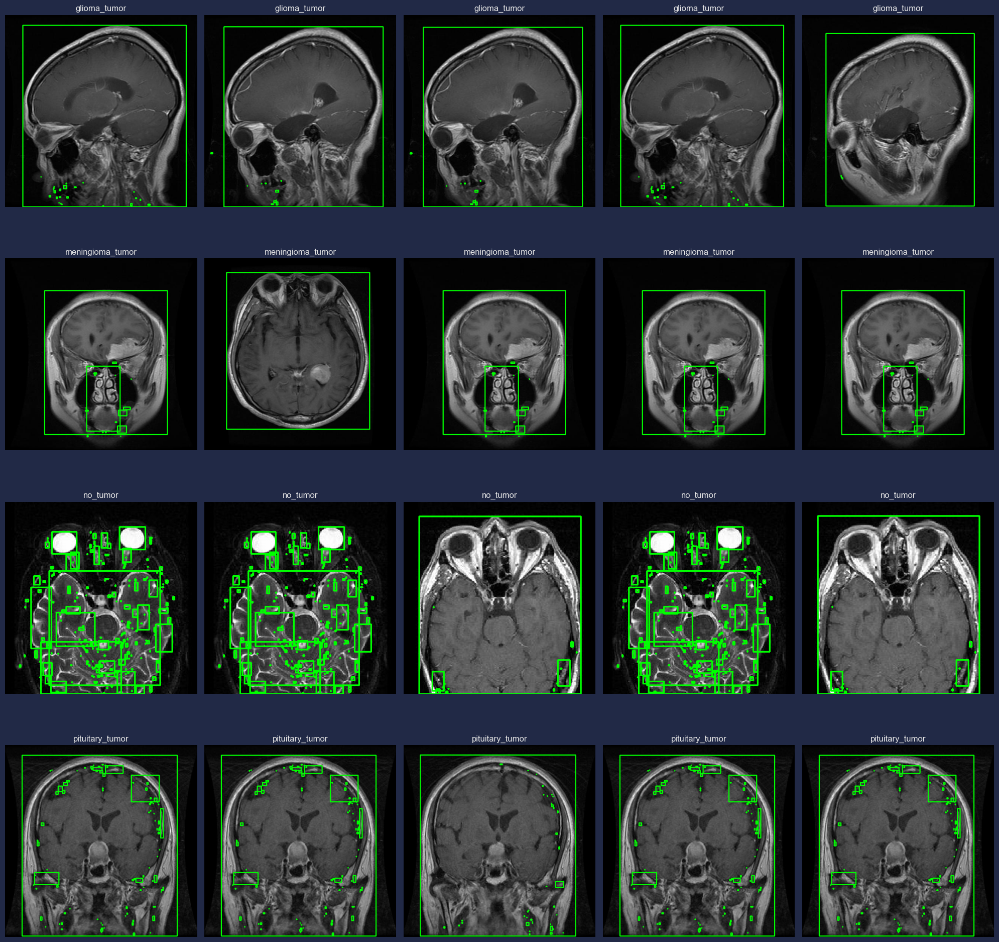

In [94]:
import os
import pandas as pd
import numpy as np
import cv2
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt

# Load dataset paths
dataset_path = 'C:\\Users\\User\\OneDrive\\Documents\\Year 2\\Masters Project\\Dataset\\Brain Tumor Classification\\Training'
categories = ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']

# Define a function to load images
def load_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    return image

# Define a function to extract ROI and calculate properties
def analyze_roi(image):
    # Apply thresholding to create a binary image
    _, binary_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    
    # Find contours in the binary image
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    roi_stats_list = []
    
    for contour in contours:
        # Create a mask for the current contour
        mask = np.zeros_like(image)
        cv2.drawContours(mask, [contour], -1, 255, thickness=cv2.FILLED)
        
        # Label the ROI and calculate properties
        labeled_roi = label(mask)
        properties = regionprops(labeled_roi)
        
        if properties:
            roi_stats = {
                'area': properties[0].area,
                'bbox_area': properties[0].bbox_area,
                'eccentricity': properties[0].eccentricity,
                'perimeter': properties[0].perimeter,
                'major_axis_length': properties[0].major_axis_length,
                'minor_axis_length': properties[0].minor_axis_length,
                'bbox': properties[0].bbox  # add bbox for visualization
            }
            roi_stats_list.append(roi_stats)
    
    return roi_stats_list

# Process each image and its annotation
all_roi_stats = []

for category in categories:
    category_path = os.path.join(dataset_path, category)
    sample_count = 0
    for filename in os.listdir(category_path):
        if filename.endswith('.jpg') and sample_count < 5:
            image_path = os.path.join(category_path, filename)
            image = load_image(image_path)
            roi_stats_list = analyze_roi(image)
            for roi_stats in roi_stats_list:
                roi_stats['category'] = category
                roi_stats['image_path'] = image_path  # save image path for visualization
                all_roi_stats.append(roi_stats)
            sample_count += 1

# Create a DataFrame with the collected ROI statistics
roi_stats_df = pd.DataFrame(all_roi_stats)

# Display the ROI statistics
print(roi_stats_df.head())

# Save the DataFrame for further analysis
roi_stats_df.to_csv('roi_stats.csv', index=False)

# Visualize 5 sample images from each category with ROI bounding boxes in a grid
fig, axes = plt.subplots(len(categories), 5, figsize=(20, 20))
for i, category in enumerate(categories):
    category_samples = roi_stats_df[roi_stats_df['category'] == category].sample(5, random_state=42)
    for j, (index, sample) in enumerate(category_samples.iterrows()):
        sample_image_path = sample['image_path']
        sample_image = load_image(sample_image_path)
        sample_rois = analyze_roi(sample_image)
        
        # Draw bounding boxes around the ROIs
        output_image = cv2.cvtColor(sample_image, cv2.COLOR_GRAY2BGR)
        for roi in sample_rois:
            minr, minc, maxr, maxc = roi['bbox']
            cv2.rectangle(output_image, (minc, minr), (maxc, maxr), (0, 255, 0), 2)
        
        # Display the image with ROIs
        ax = axes[i, j]
        ax.imshow(output_image, cmap='gray')
        ax.set_title(f'{category}')
        ax.axis('off')

plt.tight_layout()
plt.show()
